## Ensemble Technique Project
### Github: https://github.com/cmelende/EnsembleTechniqueProject.git
### Cory Melendez
### 7/31/2022

In [458]:
import pandas as pd
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn import metrics
import matplotlib.pyplot as plt
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier

sns.set(rc={'figure.figsize':(11.7,8.27)})

In [303]:
bankData = pd.read_csv('bank-full.csv')
bankData.head()

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,Target
0,58,management,married,tertiary,no,2143,yes,no,unknown,5,may,261,1,-1,0,unknown,no
1,44,technician,single,secondary,no,29,yes,no,unknown,5,may,151,1,-1,0,unknown,no
2,33,entrepreneur,married,secondary,no,2,yes,yes,unknown,5,may,76,1,-1,0,unknown,no
3,47,blue-collar,married,unknown,no,1506,yes,no,unknown,5,may,92,1,-1,0,unknown,no
4,33,unknown,single,unknown,no,1,no,no,unknown,5,may,198,1,-1,0,unknown,no


### 1. Univariate Analysis

### Description of indipendent variables


In [304]:
class UniVariateAnalysis:

    def __init__(self, df, columnName):
        self.columnName = columnName
        self.dataframe = df
        self.series = df[columnName]
    
    def get_q1(self):
        return self.series.quantile(.25)

    def get_q2(self):
        return self.series.quantile(.5)

    def get_q3(self):
        return self.series.quantile(.75)

    def get_q4(self):
        return self.series.quantile(1)

    def get_iqr(self):
        return self.get_q3() - self.get_q1()

    def get_min(self):
        return self.dataframe[self.columnName].min()

    def get_median(self):
        return self.dataframe[self.columnName].median()

    def get_max(self):
        return self.dataframe[self.columnName].max()

    def get_data_type(self):
        return self.dataframe[self.columnName].dtypes

    def get_lower_outlier_rows(self):
        return self.dataframe.loc[(self.dataframe[self.columnName] < self.get_lower_whisker_value())]

    def get_lower_whisker_value(self):
        return self.get_q1() - ((3/2) * self.get_iqr())

    def get_higher_outlier_rows(self):
        return self.dataframe.loc[(self.dataframe[self.columnName] > self.get_higher_whisker_value())]

    def get_higher_whisker_value(self):
        return self.get_q3() + ( (3/2) * self.get_iqr())

    def get_std(self):
        return self.series.std()

    def get_mean(self):
        return self.series.mean()

In [305]:
class UniVariateReport: 
    def __init__(self, uniVariateAnalysis):
        self.analysis = uniVariateAnalysis
    
    def print_quartiles(self):
        print("Q1: " , self.analysis.get_q1())
        print("Q2: ", self.analysis.get_q2())
        print("Q3: ", self.analysis.get_q3())
        print("Q4: ", self.analysis.get_q4())
        print("Mean: ", self.analysis.get_mean())
        print("Min: ", self.analysis.get_min())
        print("Median: ", self.analysis.get_median())
        print("Max: ", self.analysis.get_max())
    
    def print_whiskers(self):
        print("Top whisker: ", self.analysis.get_higher_whisker_value())
        print("Bottom whisker: ", self.analysis.get_lower_whisker_value())

    def print_data_type(self):
        print("Data type: ", self.analysis.get_data_type())

    def print_value_range(self):
        print(f'Range of values: ({self.analysis.get_min()}, {self.analysis.get_max()})')

    def print_std(self):
        print("Standard deviation: ", self.analysis.get_std())

    def print_report(self):
        self.print_data_type()
        self.print_value_range()
        self.print_std()
        self.print_quartiles()
        self.print_whiskers()

### Age
* meaning - Age of person, possibly a good indicator of target variable
* analysis - Distribution of the data seems to indicate that most of the people in the dataset are 'younger' to middle aged.
* missing values - No missing values, we can probably safely asssume that anyone over the age of 18 is a valid customer
* outliers - quite a few rows that are outside of the top whisker but no values below the bottom whisker. 
* Data treatment - Getting rows with outliers in age may be a good choice here just due to the fact that older people may not be good candidates for investing. Usually people in retirement have already invested where they could and rely on their money being liquid in order to continue paying for essentials.

In [306]:
ageAnalysis = UniVariateAnalysis(bankData, 'age')
ageAnalysisReport = UniVariateReport(ageAnalysis)
ageAnalysisReport.print_report()

Data type:  int64
Range of values: (18, 95)
Standard deviation:  10.61876204097542
Q1:  33.0
Q2:  39.0
Q3:  48.0
Q4:  95.0
Mean:  40.93621021432837
Min:  18
Median:  39.0
Max:  95
Top whisker:  70.5
Bottom whisker:  10.5


In [307]:
ageAnalysis.get_higher_outlier_rows()

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,Target
29158,83,retired,married,primary,no,425,no,no,telephone,2,feb,912,1,-1,0,unknown,no
29261,75,retired,divorced,primary,no,46,no,no,cellular,2,feb,294,1,-1,0,unknown,no
29263,75,retired,married,primary,no,3324,no,no,cellular,2,feb,149,1,-1,0,unknown,no
29322,83,retired,married,tertiary,no,6236,no,no,cellular,2,feb,283,2,-1,0,unknown,no
29865,75,retired,divorced,primary,no,3881,yes,no,cellular,4,feb,136,3,-1,0,unknown,yes
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45163,71,retired,married,secondary,no,2064,no,no,cellular,9,nov,379,2,92,3,failure,no
45191,75,retired,divorced,tertiary,no,3810,yes,no,cellular,16,nov,262,1,183,1,failure,yes
45204,73,retired,married,secondary,no,2850,no,no,cellular,17,nov,300,1,40,8,failure,yes
45207,71,retired,divorced,primary,no,1729,no,no,cellular,17,nov,456,2,-1,0,unknown,yes


In [308]:
ageAnalysis.get_lower_outlier_rows()

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,Target


In [309]:
bankData.describe()

,age,balance,day,duration,campaign,pdays,previous
count,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000
mean,40.936210,1362.272058,15.806419,258.163080,2.763841,40.197828,0.580323
std,10.618762,3044.765829,8.322476,257.527812,3.098021,100.128746,2.303441
min,18.000000,-8019.000000,1.000000,0.000000,1.000000,-1.000000,0.000000
25%,33.000000,72.000000,8.000000,103.000000,1.000000,-1.000000,0.000000
50%,39.000000,448.000000,16.000000,180.000000,2.000000,-1.000000,0.000000
75%,48.000000,1428.000000,21.000000,319.000000,3.000000,-1.000000,0.000000
max,95.000000,102127.000000,31.000000,4918.000000,63.000000,871.000000,275.000000


<AxesSubplot:xlabel='age'>

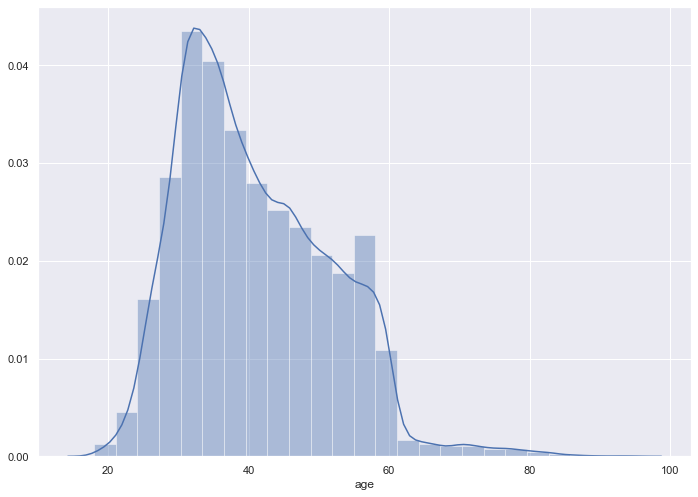

In [310]:
sns.distplot(bankData['age'], bins=25)

<AxesSubplot:xlabel='age'>

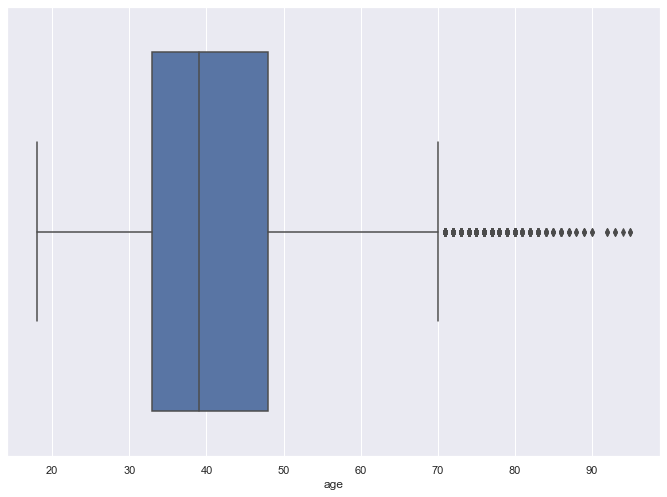

In [311]:
sns.boxplot(bankData['age'])

In [312]:
#Bad data search
bankData.loc[(bankData['age'] < 18)]

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,Target


### Job
* meaning - Job of person, categorical variable, has 12 distinct values 
* analysis - luckily there isnt many 'unknown' job type occurances. most of the jobs seem sto be combination of managment, technician, and blue collar worker. Probably a really good indicator of target variable. Since we are working from bank data, money will play a large role in target variable (whatever it may represent)
* missing values - 'unknown' may be a missing value 
* outliers - categorical variable - so we are not easily able to determine any outliers without context
* Datatype: object
* range - ['management', 'technician', 'entrepreneur', 'blue-collar','unknown', 'retired', 'admin.', 'services', 'self-employed','unemployed', 'housemaid', 'student']
* data treatment: The 'unknown' value here may pose the greatest challenge for this column, we may want to remove these rows but we may not just because it could be the customer's unwillingness to share that they are unemployed so it may be a good indicator that they would not be a good candidate for term deposit subscription. We will want to convert the column to dummy variables



In [313]:
bankData['job'].unique().size
bankData['job'].dtypes

dtype('O')

In [314]:
bankData['job'].unique()

array(['management', 'technician', 'entrepreneur', 'blue-collar',
       'unknown', 'retired', 'admin.', 'services', 'self-employed',
       'unemployed', 'housemaid', 'student'], dtype=object)

<AxesSubplot:xlabel='job', ylabel='count'>

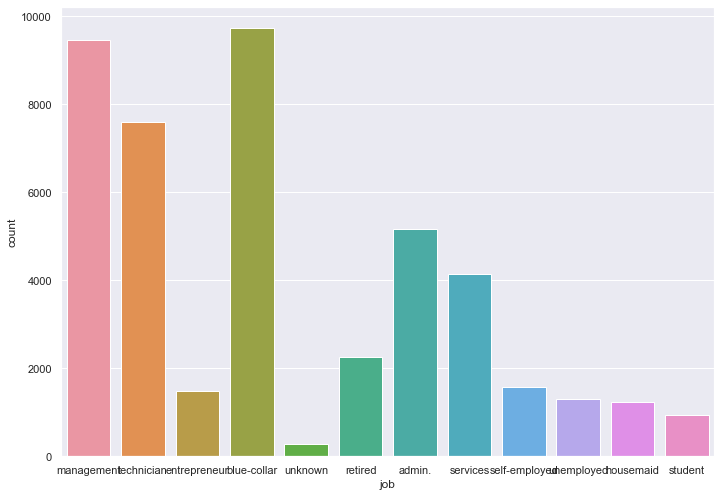

In [315]:
sns.countplot(x="job", data=bankData)

### Marital
* meaning - Whether or not the person is married
* analysis - Probably also a good indicator since married people may or may not have kids which cost money. Or they may have no kids, in which case households with two incomes would play a large factor in determining the target variable. Divorced people will also be a good candidate for predicting target variable since 1) the person may have to pay alimony and/or child support or 2) the person may be receiving alimony or child support. It would be beneficial for the bank to provide this info so we can better predict which describes the person best. The distribution is mostly concentrated over the married value, with divorced being the least likely.
* missing values - no missing values, the distinct value in the series is a logical value
* outliers - Categorical value, no outliers
* range - ['married','single','divorce']
* data type - object
* data treatment - Dont see the need to remove any rows, there are no outliers and all the values are valid. We will want to convert the column to dummy variables

In [316]:
bankData['marital'].dtypes

dtype('O')

In [317]:
bankData['marital'].unique().size

3

In [318]:
bankData['marital'].unique()

array(['married', 'single', 'divorced'], dtype=object)

<AxesSubplot:xlabel='marital', ylabel='count'>

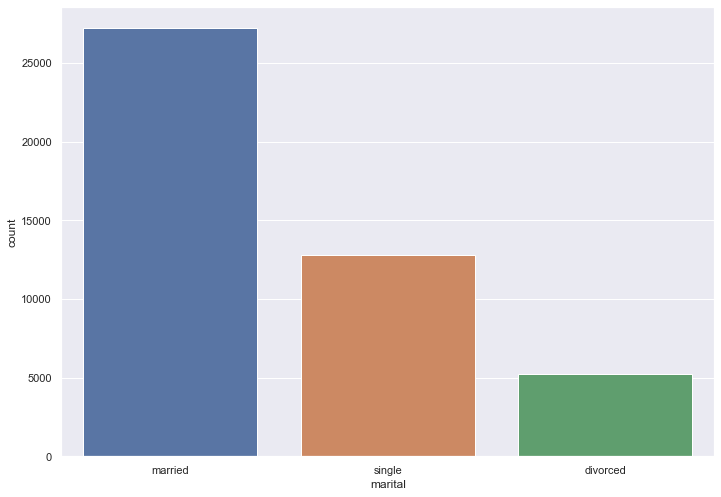

In [319]:
sns.countplot(x="marital", data=bankData)

### Education
* meaning - Highest education of the bank customer
* analysis - distribution is concentrated among the tertiary and secondary values. Since higher education can result in better understanding of how loans, interest, etc work, then this is a good candidate for predicting our target variable
* missing values - 'unknown' could be considered a missing value, but most likely should be kept in
* outliers - categorical value, so no outliers
* data type - object
* range - ['tertiary', 'secondary', 'unknown', 'primary']
* data treatment - althought we could consider the 'unknown' value as missing, we probably shouldnt, like job this may be the customer not wanting to share personal information on their education level since it may be lower than average. Therefore we would probably want to keep the rows with this value in since education level could largely drive whether or not they would be willing and able to understand the importance of term deposits. We will want to convert the column to dummy variables

In [320]:
bankData['education'].unique()

array(['tertiary', 'secondary', 'unknown', 'primary'], dtype=object)

In [321]:
bankData['education'].unique().size

4

<AxesSubplot:xlabel='education', ylabel='count'>

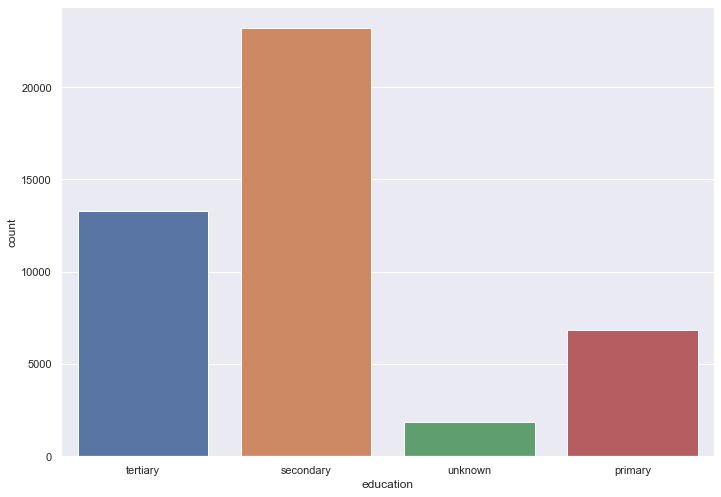

In [322]:
sns.countplot(x="education", data=bankData)

### Default
* meaning - This column could mean whether or not the customer has defaulted on their loan. This is basically a bool column (or int column with values in (0,1))
* analysis - Very good predictor for whether or not the customer will subscribe to a term deposit. Since people that do not default on their loan usually take smart measures to do so, they are more likely to be aware of their financial health and can predict long term if they are able to pay back a loan. This skill of predicting if they can pay back a loan can result in people that do not default be more willing to subscribe to term deposit. But since most people do not default on their loan, it may be the case that its a better predictor of people that will not subscribe to term deposit.
* missing values - no missing values
* outliers - categorical variable - no outliers
* data type - object
* range - ['yes','no']
* data treatment - no data treatment needed since there are no unusual values or missing values.  We will want to convert the column to dummy variables or conver the yes/no to 1/0, respectively

<AxesSubplot:xlabel='default', ylabel='count'>

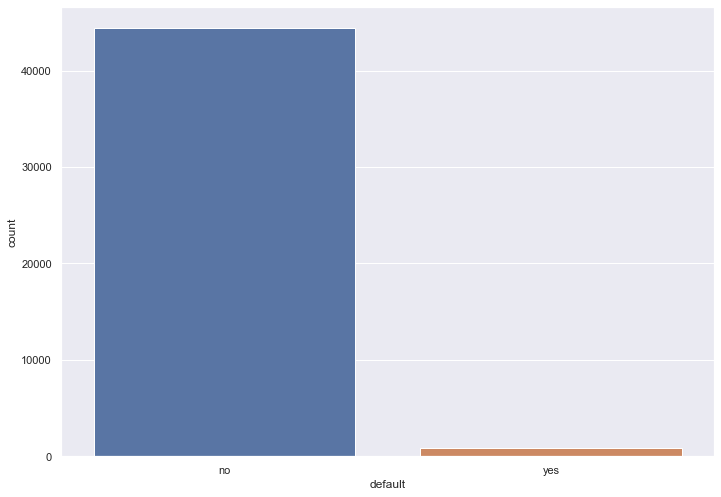

In [323]:
sns.countplot(x="default", data=bankData)

In [324]:
bankData['default'].unique()

array(['no', 'yes'], dtype=object)

### Balance
* meaning - Current balance of customer's bank account
* analysis - This probably has one of the greatest potentials to be a predictor of the target variable. Money sitting in a bank account that is not being spent will be lost due to inflation and does not do the customer any good to have that money not earning any type of interest via a term deposit. Most people seem to have around 0-10k money in the bank which seems congruent to the middle class
* missing values - No missing values.
* outliers - Plenty of outliers, though I am curious if I should get rid of the rows - logically, the outliers here are the super rich, if by some chance a super rich person becomes a member at the bank then I would certainly want to almost 100% aim to market term depositing towards the individual. The cost of getting a FN for a high income individual would be large - seems like a lot of potential revenue loss. 
* data treatment - Will probably keep the higher outliers in since we do want the  model to predict that higher income individuals will be much more likely or much less likely to subscribe to term deposits. The lower outliers though we may want to take out just because there are so few of them and they seem to indicate that the customer owes money to the bank, which in reality shouldnt be possible to a large degree like we see in the data.

In [325]:
balance_analysis = UniVariateAnalysis(bankData, 'balance')
balance_analysis_report = UniVariateReport(balance_analysis)
balance_analysis_report.print_report()

Data type:  int64
Range of values: (-8019, 102127)
Standard deviation:  3044.765829168518
Q1:  72.0
Q2:  448.0
Q3:  1428.0
Q4:  102127.0
Mean:  1362.2720576850766
Min:  -8019
Median:  448.0
Max:  102127
Top whisker:  3462.0
Bottom whisker:  -1962.0


<AxesSubplot:xlabel='balance'>

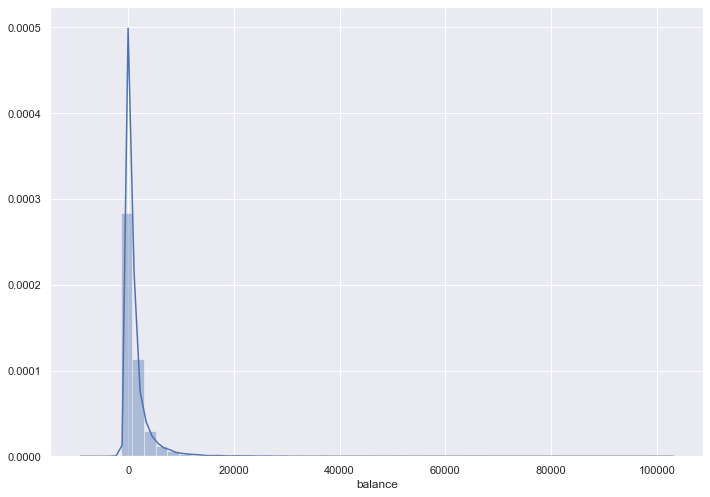

In [326]:
sns.distplot(bankData['balance'], bins=50)

<AxesSubplot:xlabel='balance'>

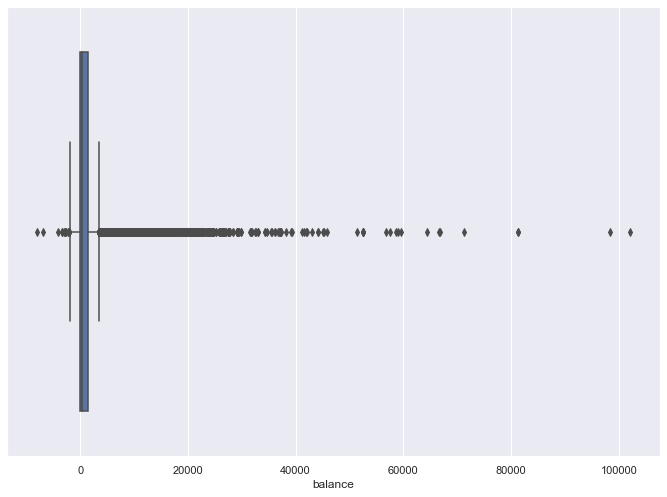

In [327]:
sns.boxplot(bankData['balance'])

In [328]:
balance_analysis.get_higher_outlier_rows()


,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,Target
34,51,management,married,tertiary,no,10635,yes,no,unknown,5,may,336,1,-1,0,unknown,no
65,51,management,married,tertiary,no,6530,yes,no,unknown,5,may,91,1,-1,0,unknown,no
69,35,blue-collar,single,secondary,no,12223,yes,yes,unknown,5,may,177,1,-1,0,unknown,no
70,57,blue-collar,married,secondary,no,5935,yes,yes,unknown,5,may,258,1,-1,0,unknown,no
186,40,services,divorced,unknown,no,4384,yes,no,unknown,5,may,315,1,-1,0,unknown,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45164,35,services,married,tertiary,no,4655,no,no,cellular,9,nov,111,2,-1,0,unknown,no
45181,46,blue-collar,married,secondary,no,6879,no,no,cellular,15,nov,74,2,118,3,failure,no
45185,60,services,married,tertiary,no,4256,yes,no,cellular,16,nov,200,1,92,4,success,yes
45191,75,retired,divorced,tertiary,no,3810,yes,no,cellular,16,nov,262,1,183,1,failure,yes


In [329]:
balance_analysis.get_lower_outlier_rows()

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,Target
1896,57,self-employed,married,tertiary,yes,-3313,yes,yes,unknown,9,may,153,1,-1,0,unknown,no
7413,43,management,married,tertiary,yes,-3372,yes,no,unknown,29,may,386,2,-1,0,unknown,no
7756,49,management,divorced,tertiary,no,-2049,yes,no,unknown,30,may,169,3,-1,0,unknown,no
11655,56,management,divorced,tertiary,yes,-1968,no,no,unknown,20,jun,60,3,-1,0,unknown,no
12909,26,blue-collar,single,secondary,yes,-8019,no,yes,cellular,7,jul,299,3,-1,0,unknown,no
13687,38,blue-collar,divorced,secondary,no,-2093,yes,yes,unknown,9,jul,120,3,-1,0,unknown,no
13708,49,entrepreneur,married,secondary,no,-1965,no,yes,telephone,10,jul,317,2,-1,0,unknown,no
14434,51,management,divorced,tertiary,no,-2282,yes,yes,cellular,14,jul,301,6,-1,0,unknown,no
15682,49,management,married,tertiary,yes,-6847,no,yes,cellular,21,jul,206,1,-1,0,unknown,no
17159,51,entrepreneur,married,secondary,yes,-2082,no,yes,cellular,28,jul,123,6,-1,0,unknown,no


In [330]:
bankData['balance'].isnull().values.any()

False

### Housing
* meaning - Housing loan status, I think this would be a very good predictor of our target variable since people with outstanding debts are probably less likely to invest if they dont have a high balance
* analysis - most people do have a housing loan - but the amount of people who do not is also very high, keeping this variable to predict the likelihood of term deposit is likely to help our model but may work in conjunction with the values of the other columsn
* missing values - no missing values
* outliers - categorical values - no outliers
* data type - object
* range - ['yes','no']
* data treatment - no data treatment, all values are valid and there are no outliers.  We will want to convert the column to dummy variables or conver the yes/no to 1/0, respectively

<AxesSubplot:xlabel='housing', ylabel='count'>

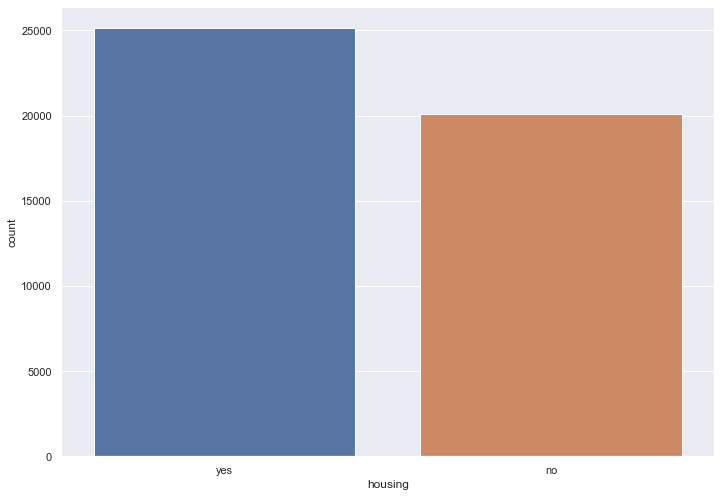

In [331]:
sns.countplot(x="housing", data=bankData)

### Loan
* meaning - Whether or not the customer has a personal loan
* analysis - By a great margin, more people do not have a personal loan. This is probably going to be a good indicator of whether or not the person will subscribe to term deposit, since like some of our other columns, the more likely you are to take out a personal loan, the less likely you are to not have much disposable income to invest in a term deposit. 
* missing values - none
* outliers - categorical value, no outliers.
* data type - object
* range - ['yes','no']
* data treatment - No removal of rows needed since all values are valid and there are not outliers, since theyre categorical - We will want to convert the column to dummy variables or conver the yes/no to 1/0, respectively

<AxesSubplot:xlabel='loan', ylabel='count'>

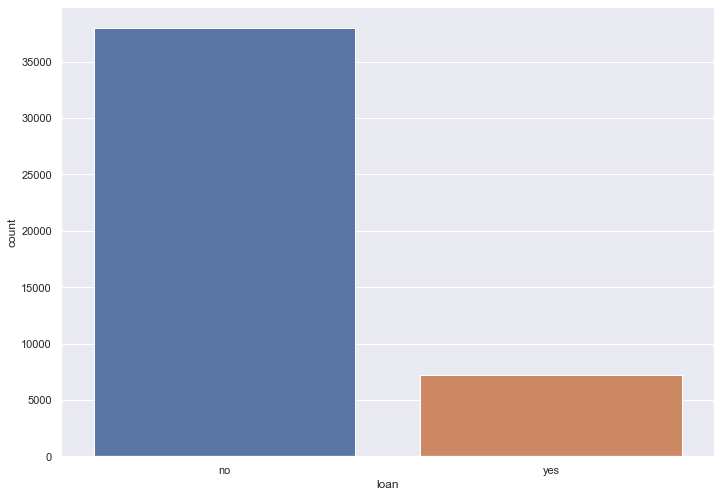

In [332]:
sns.countplot(x="loan", data=bankData)

### Contact
* meaning - The type of communication that the customer has set up with the bank
* analysis - A majority of people have cellular contact - this could actually be a really good indicator of whether or not the marketing team should market to this customer. Since customers with an 'unknown' contact would be difficult to communicate with, it may not be worth it to send out marketing material to those customers since we would either not have a way to do so or the way we do so would be an avenue which is not likely to reach the customer (flyer, mail, etc). Doing so through a text may be less intrusive and not cause any customers to be upset, while telephone may cause people to become upset at the calls they are getting from the bank, they are more intrusive.
* missing values - None, i will assume that 'unknown' can be intrepreted as 'no communication'
* outliers - categorical values - no outliers
* range - ['unknown', 'cellular', 'telephone']
* data type - object
* data treatment - No removing rows, even the 'unknown' value seems important so we will not want to remove that. Will want to make these columns dummy variables

<AxesSubplot:xlabel='contact', ylabel='count'>

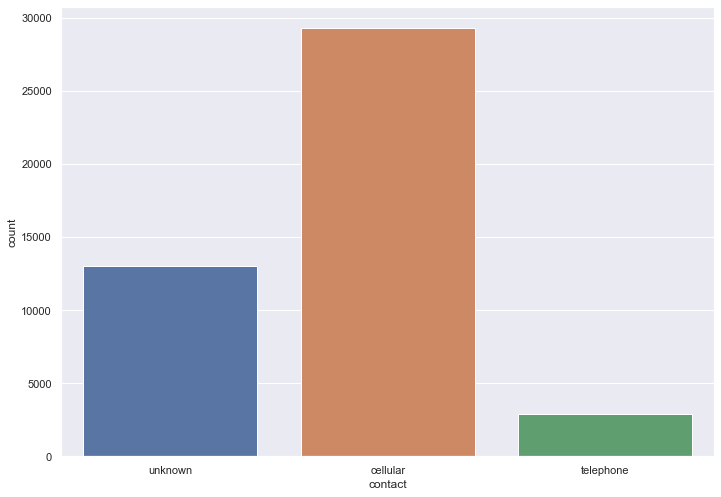

In [333]:
sns.countplot(x="contact", data=bankData)

In [334]:
bankData['contact'].unique()

array(['unknown', 'cellular', 'telephone'], dtype=object)

### Day
* meaning - In conjuction with month and duration, this represent the day of the month in which the customer was last contacted
* analysis - I dont think this has a very good potential to be a predictor of the target variable, at least on its own. However, in conjuction with the month,duration and contact columns, this may be a good predictor. In conjuction with those columns we can probably derive some meaning on how likely the person is to answer a call or text (maybe they are less likely on the weekend or a holiday or less likely to answer or respond if the bank recently contacted them already).
* missing values - None, looks like there are no values outside of 1 through 31 that would constitute a missing value
* outliers - No outlier rows, even if there were, outliers dont really make sense given the context of this column, there isnt really a day that is outside of the normal month that can be considered an outlier
* data treatment - no data treatment, all data is valid and logically it doesnt make sense to think of a certain day as an 'outlier', especially when that day is dependent on the month (ie, the day of  month A landed on a holiday but the same day value with month B did not)

In [335]:
day_analysis = UniVariateAnalysis(bankData, 'day')
day_analysis_report = UniVariateReport(ageAnalysis)
day_analysis_report.print_report()

Data type:  int64
Range of values: (18, 95)
Standard deviation:  10.61876204097542
Q1:  33.0
Q2:  39.0
Q3:  48.0
Q4:  95.0
Mean:  40.93621021432837
Min:  18
Median:  39.0
Max:  95
Top whisker:  70.5
Bottom whisker:  10.5


In [336]:
day_analysis.get_higher_outlier_rows()

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,Target


In [337]:
day_analysis.get_lower_outlier_rows()

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,Target


In [338]:
bankData['day'].isnull().values.any()

False

<AxesSubplot:xlabel='day', ylabel='count'>

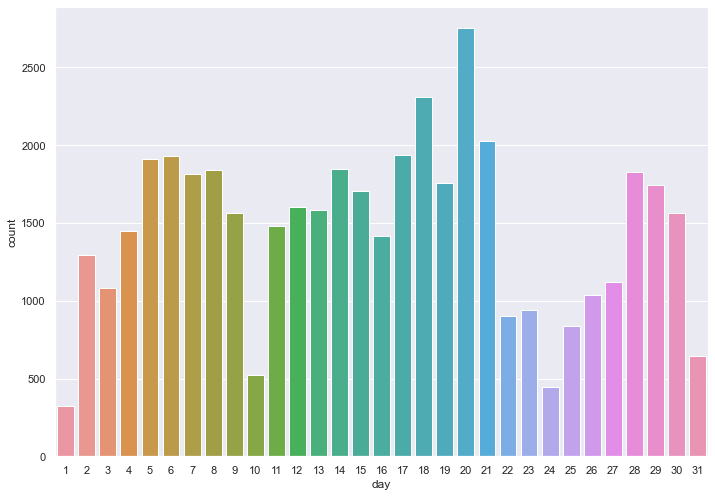

In [339]:
sns.countplot(x="day", data=bankData)

<AxesSubplot:xlabel='day'>

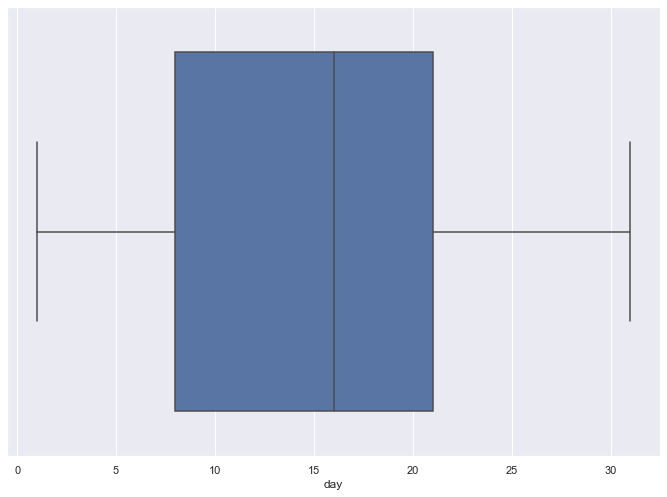

In [340]:
sns.boxplot(bankData['day'])


### Month
* meaning - The month in which last contact was made with the customer
* range - ['may', 'jun', 'jul', 'aug', 'oct', 'nov', 'dec', 'jan', 'feb',
       'mar', 'apr', 'sep']
* analysis - In conjuction with contact, day, & duration, this may be a good predictor otherwise probably not. We talked ealier about how day, this column, contact, & duration may be a good indicator and the information in these columns could derive some meaning for our model to predict our target variable.
* missing values - No missing values
* outliers - Categorical variable, no outliers
* data type - object
* data treatment - No data treatment, all values are valid and there are no outliers

<AxesSubplot:xlabel='month', ylabel='count'>

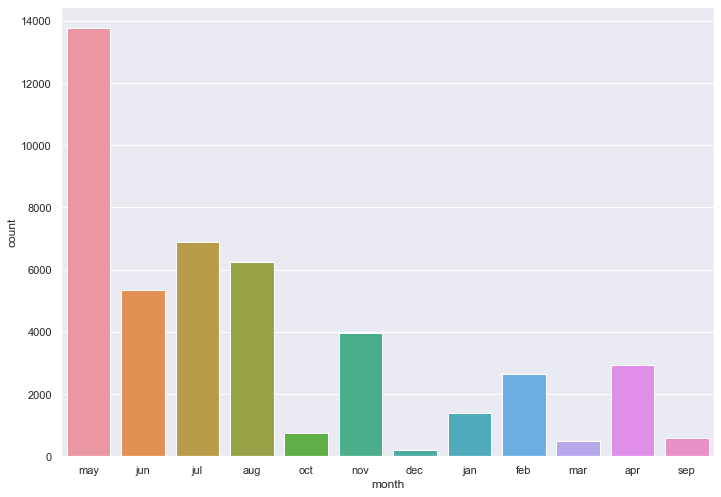

In [341]:
sns.countplot(x="month", data=bankData)

In [342]:
bankData['month'].unique()

array(['may', 'jun', 'jul', 'aug', 'oct', 'nov', 'dec', 'jan', 'feb',
       'mar', 'apr', 'sep'], dtype=object)

### Duration
* meaning - How long the last contact with the customer lasted
* analysis - This is probably a good predictor of our target variable. The last contact could be a good sign since it may have information on what was talked about. If the model can derive the range of time that resulted convincing the customer to subscribe to term deposits, then it would be a good predictor. With higher times, it either be that the customer wanted more information on term deposits or simply they changed the subject to ask another question. Or it could be that more time is equal to actually setting up a term deposit (depending on the laws that the bank is bound to, ie: the bank can subscribe customers to term deposits over the phone). 
* missing values - No missing values
* outliers - Yes quite a few outliers, which may indicate that the customer asked about another issue with the bank and talked about that instead of the term deposit. Which in that case would indicate that the person did not take the offer of a term deposit seriously and just used the opportunity to talk about some other bank related questions. Or we may want to include outliers if it really does take a long time for people to ask the questions they need answered in order to decide if they want to subscribe to term deposits. It could also indicate that they ask more questions because they are unsure if they want to and are on the fence about subscribing.
* data treatment - there are no invalid values but we will want to probably remove the outliers in this column since a unusually long or unusually short duration may be very uncommon or could be an indicator of something else happening on the phone call unrelated to the discussion of whether or not the client should subscribe to term deposits.

In [343]:
duration_analysis = UniVariateAnalysis(bankData, 'duration')
duration_analysis_report = UniVariateReport(duration_analysis)
duration_analysis_report.print_report()

Data type:  int64
Range of values: (0, 4918)
Standard deviation:  257.5278122651719
Q1:  103.0
Q2:  180.0
Q3:  319.0
Q4:  4918.0
Mean:  258.1630797814691
Min:  0
Median:  180.0
Max:  4918
Top whisker:  643.0
Bottom whisker:  -221.0


In [344]:
bankData['duration'].isnull().values.any()

False

<AxesSubplot:xlabel='duration'>

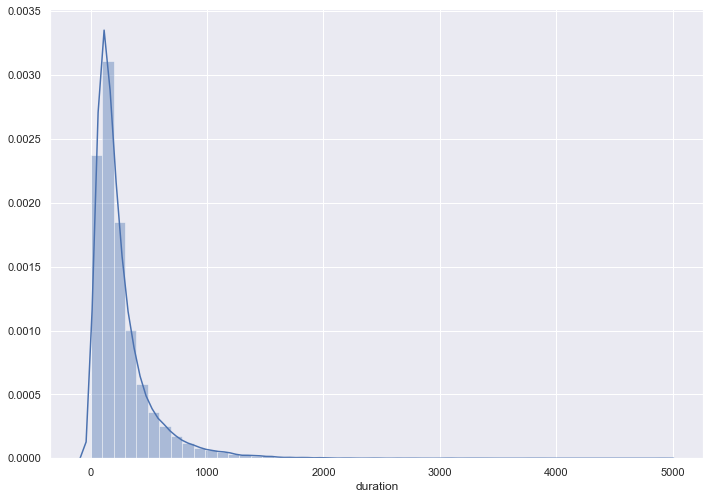

In [345]:
sns.distplot(bankData['duration'], bins=50)

<AxesSubplot:xlabel='duration'>

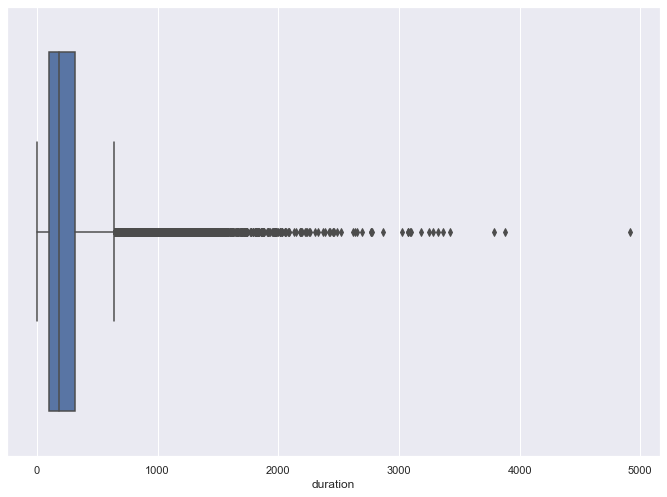

In [346]:
sns.boxplot(bankData['duration'])

In [347]:
duration_analysis.get_higher_outlier_rows()

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,Target
37,53,technician,married,secondary,no,-3,no,no,unknown,5,may,1666,1,-1,0,unknown,no
43,54,retired,married,secondary,no,529,yes,no,unknown,5,may,1492,1,-1,0,unknown,no
53,42,admin.,single,secondary,no,-76,yes,no,unknown,5,may,787,1,-1,0,unknown,no
59,46,services,married,primary,no,179,yes,no,unknown,5,may,1778,1,-1,0,unknown,no
61,53,technician,divorced,secondary,no,989,yes,no,unknown,5,may,812,1,-1,0,unknown,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45124,27,blue-collar,single,primary,no,232,yes,no,cellular,26,oct,701,2,-1,0,unknown,yes
45199,34,blue-collar,single,secondary,no,1475,yes,no,cellular,16,nov,1166,3,530,12,other,no
45200,38,technician,married,secondary,no,557,yes,no,cellular,16,nov,1556,4,-1,0,unknown,yes
45206,51,technician,married,tertiary,no,825,no,no,cellular,17,nov,977,3,-1,0,unknown,yes


In [348]:
duration_analysis.get_lower_outlier_rows()

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,Target


### Campaign
* meaning - Number of times that the customer has been contacted throughout the campaign
* analysis - Most of the people have been contacted very few times. This coupled with month, day, duration, and contact may be a very good predictor of the target variable since people may be more or less likely to subscribe to term deposits if they have been contacted a lot. Some customers may become frusterated and refuse to subscribe, while others may feel pressured and subscribe just to stop the communication. 
* missing values - none
* outliers - There are quite a few outliers beyond the top whisker,we may want to trim these just because the more contacts that we had with the customer it seems like the less likely they are to finally give in and subscribe. 
* data treatment - we will want to remove the outliers for this column, by contacting them a large number of times, the customer could be frusterated to the point that they will not ever want to subscribe (at least to our bank) or the bank may lose them as a customer or they are just plain not interested in term deposits no matter their financial status.

In [349]:
bankData['campaign'].isnull().values.any()

False

In [350]:
campaign_analysis = UniVariateAnalysis(bankData, 'campaign')
campaign_analysis_report = UniVariateReport(campaign_analysis)
campaign_analysis_report.print_report()

Data type:  int64
Range of values: (1, 63)
Standard deviation:  3.0980208832791694
Q1:  1.0
Q2:  2.0
Q3:  3.0
Q4:  63.0
Mean:  2.763840658246887
Min:  1
Median:  2.0
Max:  63
Top whisker:  6.0
Bottom whisker:  -2.0


In [351]:
campaign_analysis.get_higher_outlier_rows()

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,Target
758,59,services,married,secondary,no,307,yes,yes,unknown,6,may,250,7,-1,0,unknown,no
780,30,admin.,married,secondary,no,4,no,no,unknown,7,may,172,8,-1,0,unknown,no
906,27,services,single,secondary,no,0,yes,no,unknown,7,may,388,7,-1,0,unknown,no
1103,52,technician,married,unknown,no,133,yes,no,unknown,7,may,253,8,-1,0,unknown,no
1105,43,admin.,married,tertiary,no,1924,yes,no,unknown,7,may,244,7,-1,0,unknown,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
44666,25,technician,single,secondary,no,1298,no,no,cellular,2,sep,206,7,94,2,other,no
44680,27,self-employed,single,tertiary,no,560,no,no,telephone,3,sep,543,9,465,2,failure,no
44770,37,services,single,tertiary,no,1189,no,no,cellular,13,sep,323,9,199,4,other,yes
44886,38,management,married,tertiary,no,0,no,no,cellular,24,sep,246,12,197,6,failure,no


In [352]:
campaign_analysis.get_lower_outlier_rows()

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,Target


<AxesSubplot:xlabel='campaign'>

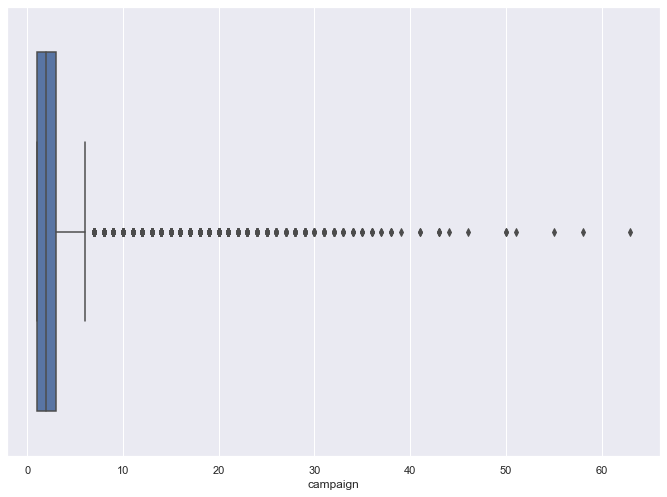

In [353]:
sns.boxplot(bankData['campaign'])

<AxesSubplot:xlabel='campaign'>

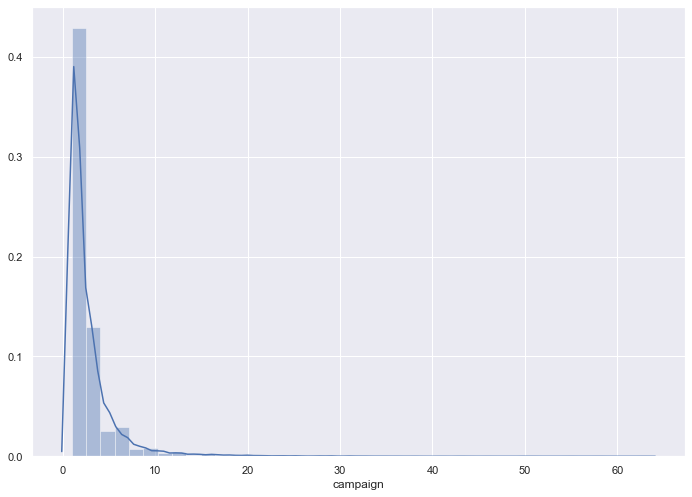

In [354]:
sns.distplot(bankData['campaign'], bins=40)


In [355]:
bankData['campaign'].unique()

array([ 1,  2,  3,  5,  4,  6,  7,  8,  9, 10, 11, 12, 13, 19, 14, 24, 16,
       32, 18, 22, 15, 17, 25, 21, 43, 51, 63, 41, 26, 28, 55, 50, 38, 23,
       20, 29, 31, 37, 30, 46, 27, 58, 33, 35, 34, 36, 39, 44],
      dtype=int64)

### Pdays
* meaning - The amount of days that have passed since the client was last contacted, -1 if the person has not been contacted or the amount of days exceeds 900 days
* analysis - A vast majority of people have not been contacted or the contact was greater than 900 days ago. May be a poor indicator since so many people have gone uncontacted, or may be a good indicator that if they were contacted just recently then they are probably not in a different financial positiion where they would want to change their mind and subscribe
* missing values - None, all values are between -1 and 871 
* outliers - Quite a few outliers on the higher side, however, I dont think that removing the outliers here will make benefit the model since we are likely to get rid of information regarding people that have refused to subscribe recently. There seems to be so many people that have not been contacted or were contacted more than 900 days ago that its categorizing most people that were contacted between 1 and 900 days as outliers. 
* data treatment - no invalid values and the 'outliers' here are such a large set because of the amount of people not contacted or contacted more than 900 days ago have lowered the percentiles where almost anyone who has been contacted is an outlier which doesnt make a whole lot of sense. 

In [356]:
bankData['pdays'].isnull().values.any()

False

In [357]:
pdays_analysis = UniVariateAnalysis(bankData, 'pdays')
pdays_analysis_report = UniVariateReport(pdays_analysis)
pdays_analysis_report.print_report()

Data type:  int64
Range of values: (-1, 871)
Standard deviation:  100.12874599059835
Q1:  -1.0
Q2:  -1.0
Q3:  -1.0
Q4:  871.0
Mean:  40.19782796222158
Min:  -1
Median:  -1.0
Max:  871
Top whisker:  -1.0
Bottom whisker:  -1.0


In [358]:
pdays_analysis.get_lower_outlier_rows()

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,Target


In [359]:
pdays_analysis.get_higher_outlier_rows()

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,Target
24060,33,admin.,married,tertiary,no,882,no,no,telephone,21,oct,39,1,151,3,failure,no
24062,42,admin.,single,secondary,no,-247,yes,yes,telephone,21,oct,519,1,166,1,other,yes
24064,33,services,married,secondary,no,3444,yes,no,telephone,21,oct,144,1,91,4,failure,yes
24072,36,management,married,tertiary,no,2415,yes,no,telephone,22,oct,73,1,86,4,other,no
24077,36,management,married,tertiary,no,0,yes,no,telephone,23,oct,140,1,143,3,failure,yes
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45199,34,blue-collar,single,secondary,no,1475,yes,no,cellular,16,nov,1166,3,530,12,other,no
45201,53,management,married,tertiary,no,583,no,no,cellular,17,nov,226,1,184,4,success,yes
45204,73,retired,married,secondary,no,2850,no,no,cellular,17,nov,300,1,40,8,failure,yes
45208,72,retired,married,secondary,no,5715,no,no,cellular,17,nov,1127,5,184,3,success,yes


In [360]:
bankData.loc[bankData['pdays'] < 0]

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,Target
0,58,management,married,tertiary,no,2143,yes,no,unknown,5,may,261,1,-1,0,unknown,no
1,44,technician,single,secondary,no,29,yes,no,unknown,5,may,151,1,-1,0,unknown,no
2,33,entrepreneur,married,secondary,no,2,yes,yes,unknown,5,may,76,1,-1,0,unknown,no
3,47,blue-collar,married,unknown,no,1506,yes,no,unknown,5,may,92,1,-1,0,unknown,no
4,33,unknown,single,unknown,no,1,no,no,unknown,5,may,198,1,-1,0,unknown,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45203,23,student,single,tertiary,no,113,no,no,cellular,17,nov,266,1,-1,0,unknown,yes
45205,25,technician,single,secondary,no,505,no,yes,cellular,17,nov,386,2,-1,0,unknown,yes
45206,51,technician,married,tertiary,no,825,no,no,cellular,17,nov,977,3,-1,0,unknown,yes
45207,71,retired,divorced,primary,no,1729,no,no,cellular,17,nov,456,2,-1,0,unknown,yes


In [361]:
#invalid
bankData.loc[(bankData['pdays'] < -1) | bankData['pdays'] > 900]

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,Target


<AxesSubplot:xlabel='pdays'>

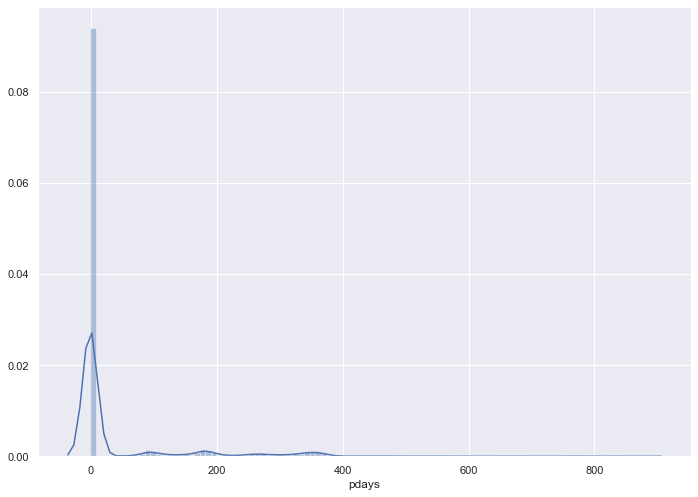

In [362]:
sns.distplot(bankData['pdays'], bins=100)

<AxesSubplot:xlabel='pdays'>

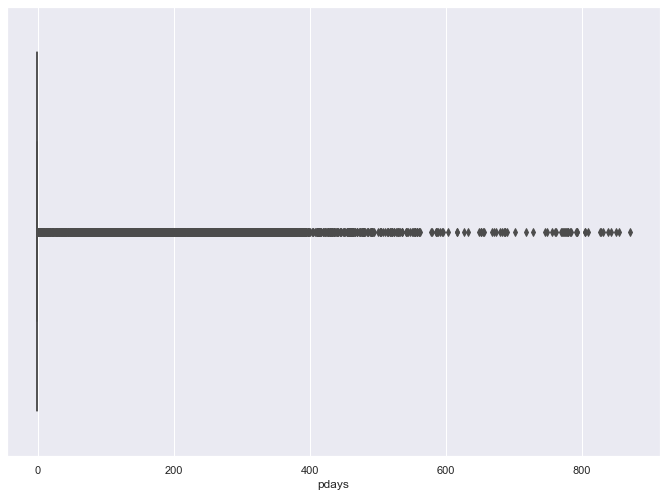

In [363]:
sns.boxplot(bankData['pdays'])

### Previous
* meaning - The amount of contacts that were made to this customer before the active campaign for the client
* analysis - Most of the customers were contacted about once before the active campaign. I predict that this will be a good predictor of the target variable since along with the other columsn, the model may gain insight on if they were not contacted or contacted few times the last time around, then it may be good to follow up with the customer again to see if their financial position has changed where they want to subscribe
* missing values - No missing values
* outliers - Quite a few outliers, may want to exclude these outliers since the bank may have annoyed them to the point where they no longer want to subscribe whether or not their financial status has changed where they would otherwise want to subscribe.
* data treatment - a lot like the 'campaign' column, we will want to exclude the outliers here since the amount of times that we contacted them may have negatively affected the banks relationship or they simply are not interested in term deposits regardless of their financial status.

In [364]:
previous_analysis = UniVariateAnalysis(bankData, 'previous')
previous_analysis_report = UniVariateReport(previous_analysis)
previous_analysis_report.print_report()

Data type:  int64
Range of values: (0, 275)
Standard deviation:  2.3034410449312213
Q1:  0.0
Q2:  0.0
Q3:  0.0
Q4:  275.0
Mean:  0.5803233726305546
Min:  0
Median:  0.0
Max:  275
Top whisker:  0.0
Bottom whisker:  0.0


In [365]:
bankData['previous'].isnull().values.any()

False

<AxesSubplot:xlabel='previous'>

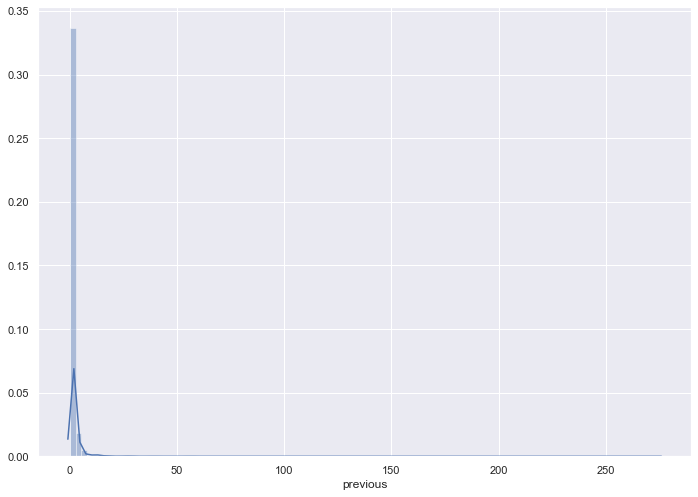

In [366]:
sns.distplot(bankData['previous'], bins=100)

<AxesSubplot:xlabel='previous'>

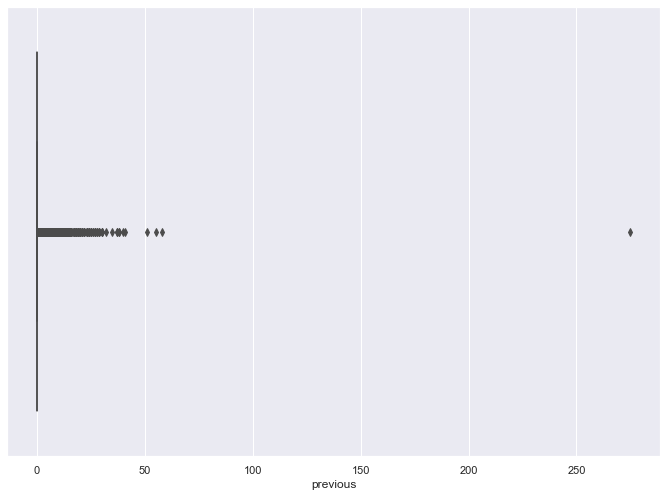

In [367]:
sns.boxplot(bankData['previous'])

In [368]:
previous_analysis.get_higher_outlier_rows()

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,Target
24060,33,admin.,married,tertiary,no,882,no,no,telephone,21,oct,39,1,151,3,failure,no
24062,42,admin.,single,secondary,no,-247,yes,yes,telephone,21,oct,519,1,166,1,other,yes
24064,33,services,married,secondary,no,3444,yes,no,telephone,21,oct,144,1,91,4,failure,yes
24072,36,management,married,tertiary,no,2415,yes,no,telephone,22,oct,73,1,86,4,other,no
24077,36,management,married,tertiary,no,0,yes,no,telephone,23,oct,140,1,143,3,failure,yes
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45199,34,blue-collar,single,secondary,no,1475,yes,no,cellular,16,nov,1166,3,530,12,other,no
45201,53,management,married,tertiary,no,583,no,no,cellular,17,nov,226,1,184,4,success,yes
45204,73,retired,married,secondary,no,2850,no,no,cellular,17,nov,300,1,40,8,failure,yes
45208,72,retired,married,secondary,no,5715,no,no,cellular,17,nov,1127,5,184,3,success,yes


In [369]:
previous_analysis.get_lower_outlier_rows()

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,Target


### Poutcome
* meaning - Whether or not the campaign for the client was successful (ie: did the customer convert to being a term deposit subscriber)
* analysis - I predic that this will be a very important variable when predicting the target since with the other column's information will give us a good insight on what type of customers are willing to be a term deposit subscriber
* missing values - hard to tell if 'unknown' and 'other' are missing values, we need more context on why we could classify a client other than fail/success
* outliers - categorial variable, so no outliers
* range - ['unknown', 'failure', 'other', 'success']
* data treatment - No data treatment without further context - the decision to remove teh values 'unknown' and 'other' may reequire mrre domain knowledge to decide whether or not these are good values

In [370]:
bankData['poutcome'].unique()

array(['unknown', 'failure', 'other', 'success'], dtype=object)

<AxesSubplot:xlabel='poutcome', ylabel='count'>

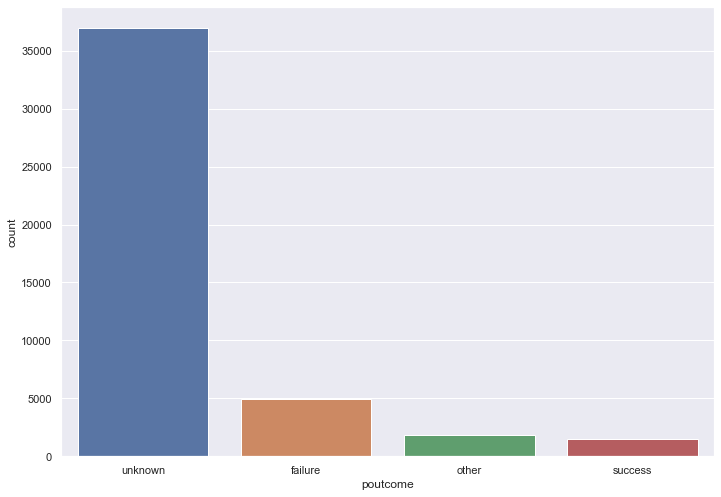

In [371]:
sns.countplot(x="poutcome", data=bankData)

### 1. Bivariate Analysis

In [372]:
bankDataWithIntTarget = bankData.copy()
bankDataWithIntTarget['Target'] = bankDataWithIntTarget['Target'].replace(['yes','no'],[1,0])
bankDataWithIntTarget

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,Target
0,58,management,married,tertiary,no,2143,yes,no,unknown,5,may,261,1,-1,0,unknown,0
1,44,technician,single,secondary,no,29,yes,no,unknown,5,may,151,1,-1,0,unknown,0
2,33,entrepreneur,married,secondary,no,2,yes,yes,unknown,5,may,76,1,-1,0,unknown,0
3,47,blue-collar,married,unknown,no,1506,yes,no,unknown,5,may,92,1,-1,0,unknown,0
4,33,unknown,single,unknown,no,1,no,no,unknown,5,may,198,1,-1,0,unknown,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45206,51,technician,married,tertiary,no,825,no,no,cellular,17,nov,977,3,-1,0,unknown,1
45207,71,retired,divorced,primary,no,1729,no,no,cellular,17,nov,456,2,-1,0,unknown,1
45208,72,retired,married,secondary,no,5715,no,no,cellular,17,nov,1127,5,184,3,success,1
45209,57,blue-collar,married,secondary,no,668,no,no,telephone,17,nov,508,4,-1,0,unknown,0


### Age
Column really doesnt seem to show much relationship between age and target,on the count plot we can see that many more people have 'no', but the increase of both 'yes' and 'no' seem to be congruent to each other as age increases then decreases. On teh scatterplot there doesnt seem to be any dots that are skewed towards one side of the graph, its looks like its oscillating


<AxesSubplot:xlabel='age', ylabel='Target'>

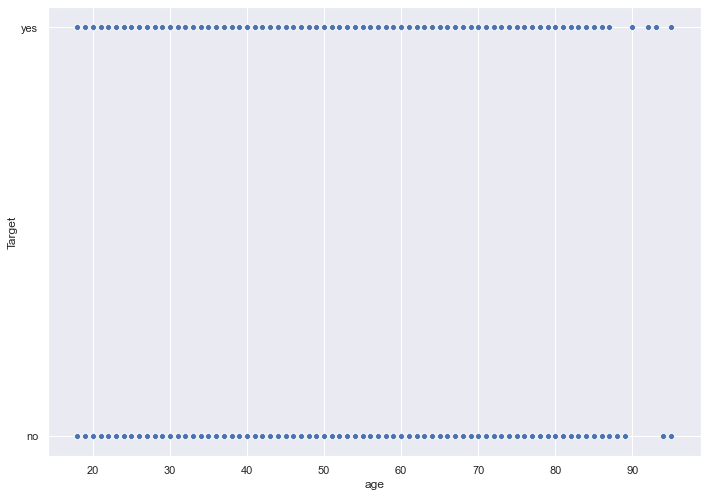

In [373]:
sns.scatterplot(bankData['age'], bankData['Target'])  # Plots the scatter plot using two variables

<AxesSubplot:xlabel='age', ylabel='count'>

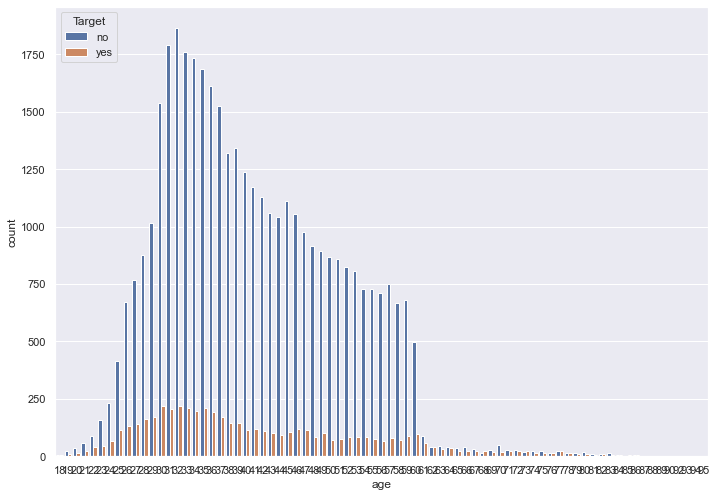

In [374]:
sns.countplot(x="age", hue="Target", data=bankData)

### Job
No immediate relationship here - we may see some relationship between if the client will subscribe if they are a student, but unforatunately, that professions seems to less frequent in the data. All other professions more or less look like they have the same ration of yes to no.

<AxesSubplot:xlabel='job', ylabel='count'>

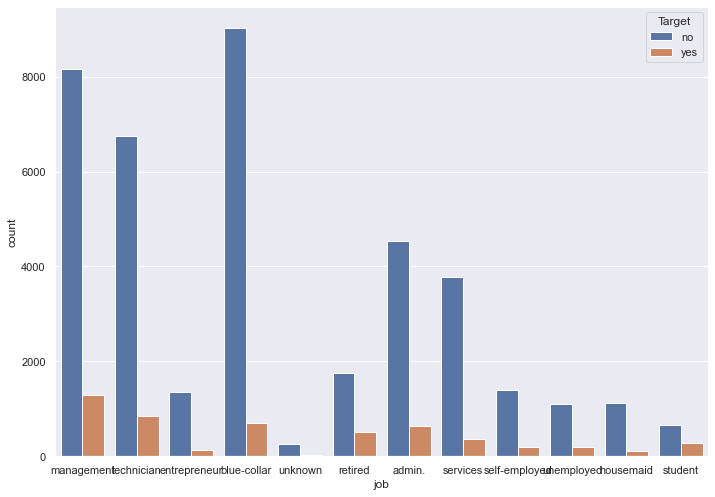

In [375]:
sns.countplot(x="job", hue="Target", data=bankData)

### Marital
Same thing as above here, there doesnt seem to be a huge difference between whether or not the client subscribed and the marital status of the person

<AxesSubplot:xlabel='marital', ylabel='count'>

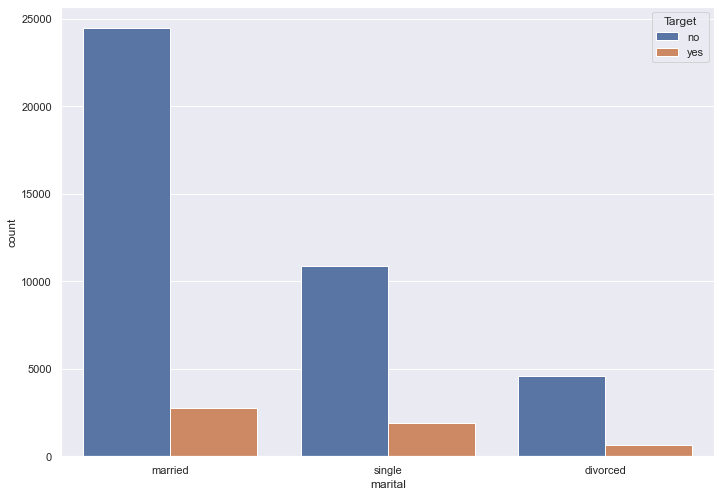

In [376]:
sns.countplot(x="marital", hue="Target", data=bankData)

### Education
Here we go - there seems to be a greater ration of people that are subscribed if they have secondary education or tertiary education vs the other ones. Unknown looks to have the lowest, which we predicted in question 1.

<AxesSubplot:xlabel='education', ylabel='count'>

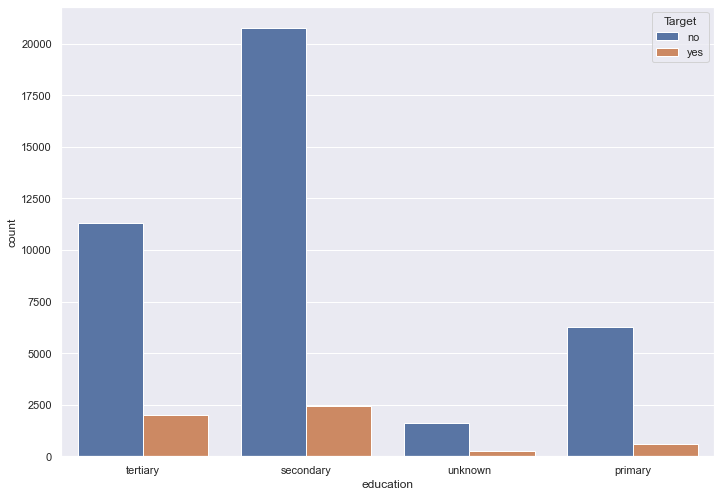

In [377]:
sns.countplot(x="education", hue="Target", data=bankData)

### Default
Easy to see here that there is a very big correlation with people who do not default on a loan and people who subscribe to term deposits

<AxesSubplot:xlabel='default', ylabel='count'>

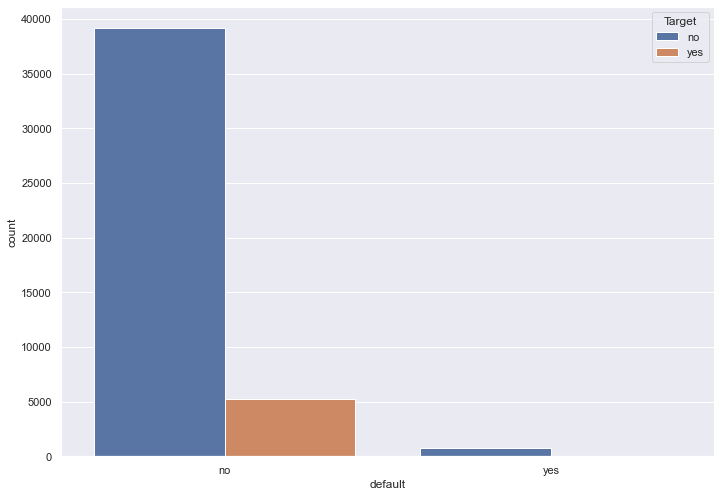

In [378]:
sns.countplot(x="default", hue="Target", data=bankData)

### Balance
Looks to be like there is a strong relationship between balance of an account and whether or not that person is subscribed to term deposits. Looks like rich people may not subscribe to term deposits as much (possibly due to other lucrative investments they take)


<AxesSubplot:xlabel='balance', ylabel='Target'>

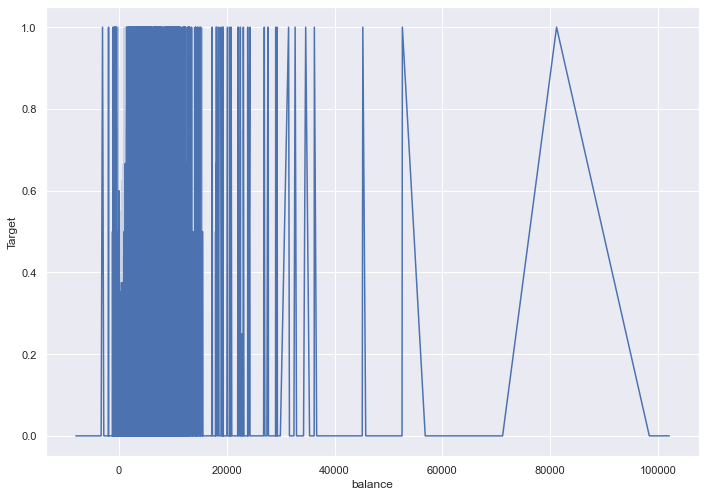

In [379]:
sns.lineplot(x='balance', y='Target', data=bankDataWithIntTarget) 

### Housing
semi strong relationship between people having no housing loan and deciding to subscribe to a term deposit. We can see that even though we see less people that do not have a housing loan, there are still more people total that also have a subscription to term deposits versus people who do have a housing loan and subscribe to term deposits

<AxesSubplot:xlabel='housing', ylabel='count'>

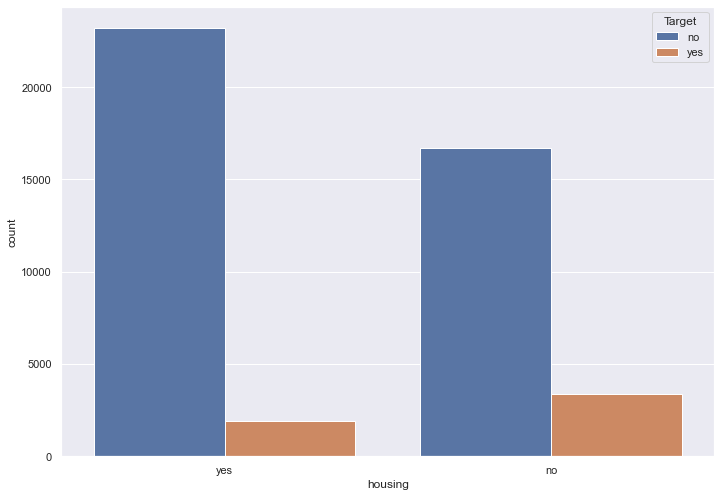

In [380]:
sns.countplot(x="housing", hue="Target", data=bankData)

### Loan
Hard to tell here if there is a relationship if any at all, there may be a slight relationship between having a personal loan and not subscribing to term deposits.

<AxesSubplot:xlabel='loan', ylabel='count'>

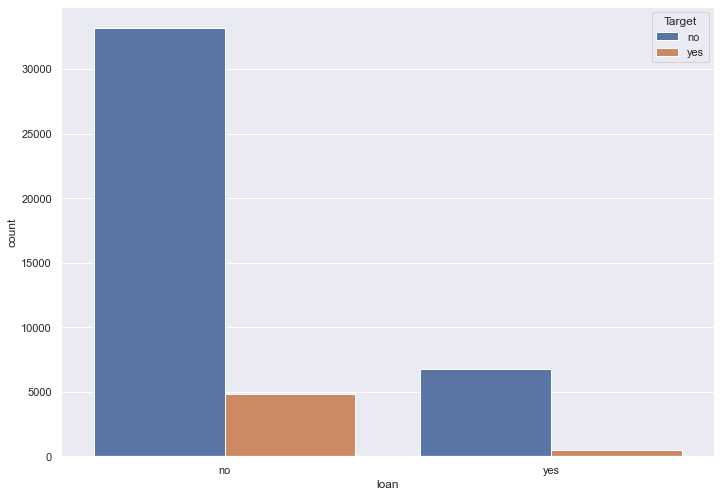

In [381]:
sns.countplot(x="loan", hue="Target", data=bankData)

### Contact
Looks to be a semi strong relationship between people with cellular contact and whether or not they have a housing loan. Maybe due to the fact that people with cell phones may receieve a different type of notification that better convinces them to subscribe to a deposit term, versus a telephone where the user may just get annoyed at being called. Unknown may be low because its hard to contact someone to market towards them without a line of contact

<AxesSubplot:xlabel='contact', ylabel='count'>

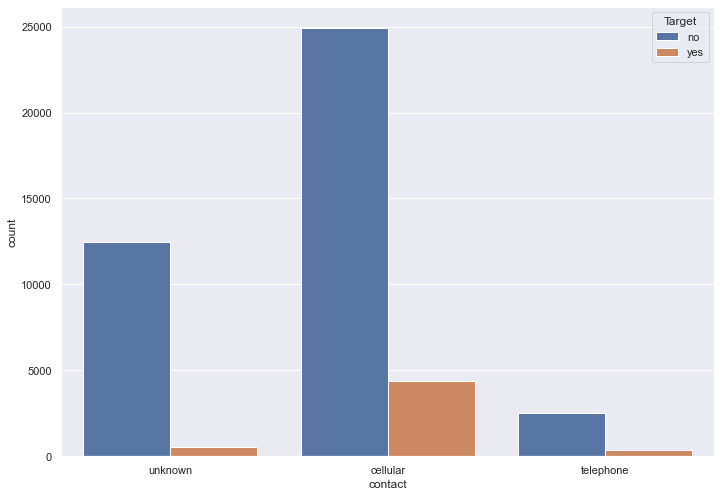

In [382]:
sns.countplot(x="contact", hue="Target", data=bankData)

### Day
Difficult to tell just from this graph without considering the month column but it appears that around the beginning and 10th of each month is the highest. Maybe this is due to the fact that people are getting paid around this time and may feel more confident to subscribe to a deposit term

<AxesSubplot:xlabel='day', ylabel='Target'>

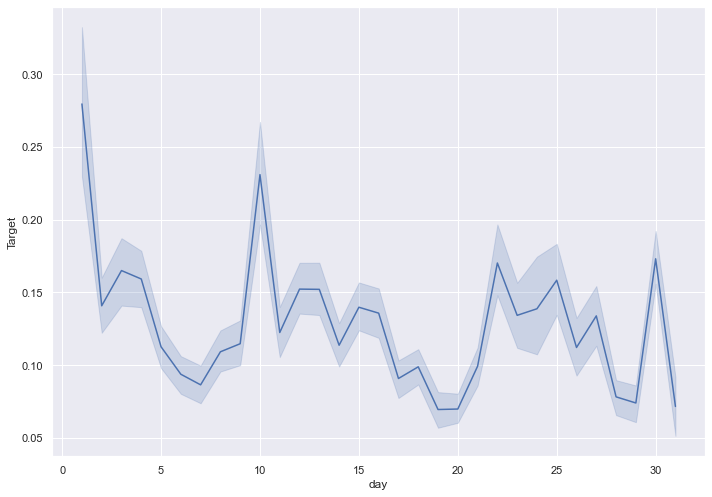

In [383]:
sns.lineplot(x='day', y='Target', data=bankDataWithIntTarget) 

### Month
Again, like day, its hard to draw any conclusions logically but it does appear to be a strong relationship between concacting the customer in Dec and March and sep -oct and if the person will subscribe to a term deposit. This could be due to the fact that many employers give employees christmas bonuses, while others (like my employer) wait until around mar to give them out

<AxesSubplot:xlabel='month', ylabel='Target'>

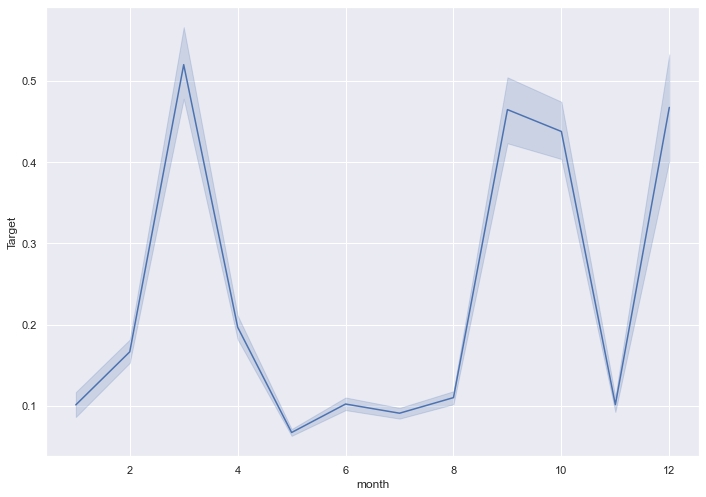

In [384]:
bank_df_int_target_int_month = bankDataWithIntTarget.copy()
bank_df_int_target_int_month['month'] = bank_df_int_target_int_month['month'].replace(['jan','feb','mar','apr','may','jun','jul','aug','sep','oct','nov','dec'],[1,2,3,4,5,6,7,8,9,10,11,12])
sns.lineplot(x='month', y='Target', data=bank_df_int_target_int_month) 

### Duration
there is a very strong relationship between duration and whether or not the person subscribes to term deposits - like we discussed earlier this may be because there is an average amount of time that is needed to explain the details of term deposits and that probably lies in the 1k-2k duration range. While people who make short communications with the bank may not ask many questions because they are simply not interested. Very long calls may end up being about something else or the person asking the questions may be asking so many questions because they are on the fence and may be attempting to 'talk themselves into it' or the bank employee may be trying to convince a person that may be slightly interested but on average doenst decide to subscribe.

<AxesSubplot:xlabel='duration', ylabel='Target'>

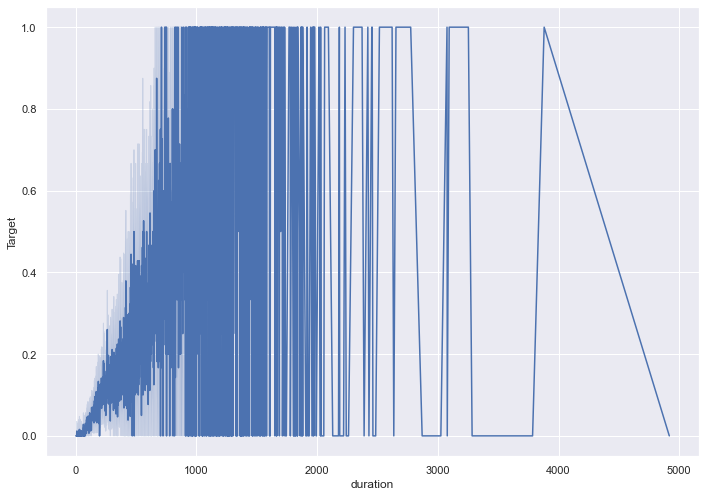

In [385]:
sns.lineplot(x='duration', y='Target', data=bankDataWithIntTarget) 

### Campaign
Seems to be a very strong correlation between people who have not been contacted that many times during this campaign and if they subscribed to term deposits. There seems to be a sweet spot where a customer will usually subscribe on the first thru 10th time, this may be because its easier to convince them while the more you call them, the less likely they are to subscribe (generally). If you keep asking a customer if they want to subscribe and they say no more than 10 times, then theyve most likely have had their mind made up. 

<AxesSubplot:xlabel='campaign', ylabel='Target'>

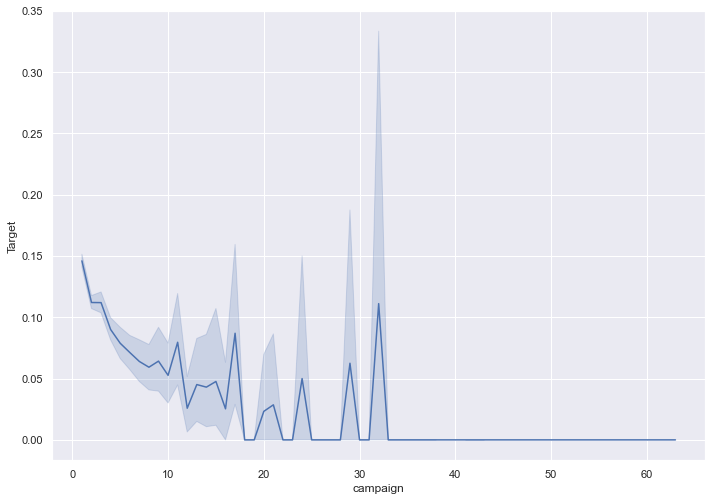

In [386]:
sns.lineplot(x='campaign', y='Target', data=bankDataWithIntTarget) 

### Pdays
Very difficullt to tell here if there is any relationship, the graph oscillates quite a bit, especially for people who have been contacted more than 400 days ago.

<AxesSubplot:xlabel='pdays', ylabel='Target'>

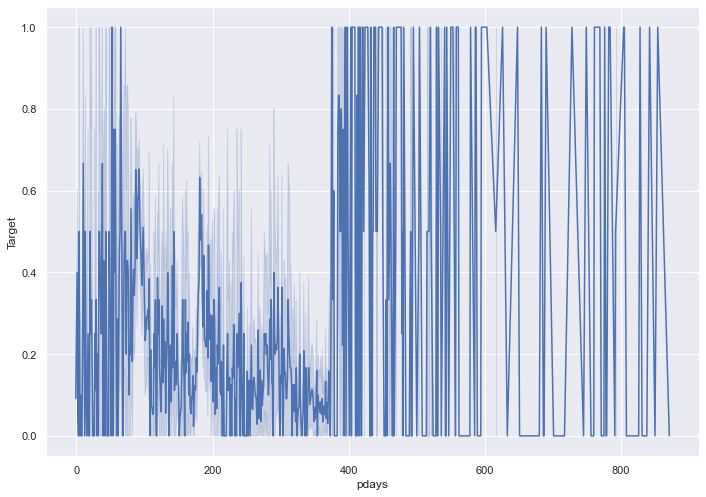

In [387]:
sns.lineplot(x='pdays', y='Target', data=bankDataWithIntTarget) 

### Previous
Like we said for campaign, seems to be a pretty strong relationship towards the beginning of the graph, possibly because it doenst take that many times to convince a person to subscribe if they are likely to subscribe. However, if the client has refused multiple times, it appears that the chance they finally say yes decreases.

<AxesSubplot:xlabel='previous', ylabel='Target'>

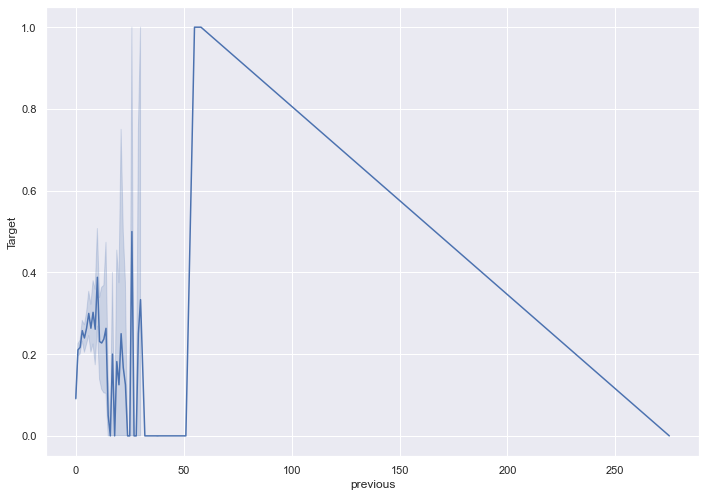

In [388]:
sns.lineplot(x='previous', y='Target', data=bankDataWithIntTarget) 

### Poutcome
very strong relationship between those who did subscribe last time to them subscribing to term deposits now. however, the total data points for that scenario are relatively low but this may be a good indicator on whether or not the person will subscribe if theyve subscribed in the past.

<AxesSubplot:xlabel='poutcome', ylabel='count'>

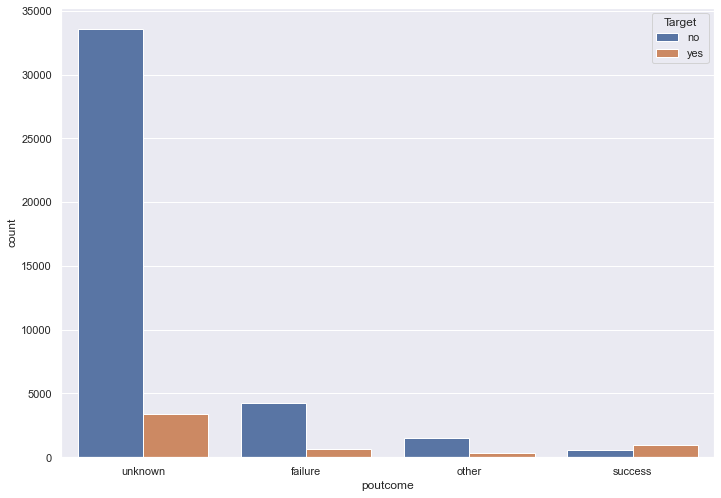

In [389]:
sns.countplot(x="poutcome", hue="Target", data=bankData)

In [390]:
bankData.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45211 entries, 0 to 45210
Data columns (total 17 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   age        45211 non-null  int64 
 1   job        45211 non-null  object
 2   marital    45211 non-null  object
 3   education  45211 non-null  object
 4   default    45211 non-null  object
 5   balance    45211 non-null  int64 
 6   housing    45211 non-null  object
 7   loan       45211 non-null  object
 8   contact    45211 non-null  object
 9   day        45211 non-null  int64 
 10  month      45211 non-null  object
 11  duration   45211 non-null  int64 
 12  campaign   45211 non-null  int64 
 13  pdays      45211 non-null  int64 
 14  previous   45211 non-null  int64 
 15  poutcome   45211 non-null  object
 16  Target     45211 non-null  object
dtypes: int64(7), object(10)
memory usage: 4.1+ MB


# Prepare The Data

In [391]:
def get_q1(df, columnName):
    return df[columnName].quantile(.25)

def get_q2(df, columnName):
    return df[columnName].quantile(.5)

def get_q3(df, columnName):
    return df[columnName].quantile(.75)

def get_q4(df, columnName):
    return df[columnName].quantile(1)

def get_iqr(df, columnName):
    return get_q3(df, columnName) - get_q1(df, columnName)

def get_lower_whisker_value(df, columnName):
    return get_q1(df, columnName) - ((3/2) * get_iqr(df, columnName))

def get_higher_whisker_value(df, columnName):
    return get_q3(df, columnName) + ( (3/2) * get_iqr(df, columnName))

 
def get_df_without_lower_outliers(df, columnNames):
    copy = df.copy()
    for col in columnNames:
        copy = copy[copy[col] >= get_lower_whisker_value(df, col)]
    return copy

def get_df_without_higher_outliers(df, columnNames):
    copy_df = df.copy()
    for col in columnNames:
        copy_df = copy_df[copy_df[col] <= get_higher_whisker_value(df, col)]
    return copy_df

def get_df_without_outliers(df, columnNames):
    copy_df = df.copy()
    for col in columnNames:
        copy_df = copy_df[(copy_df[col] <= get_higher_whisker_value(df, col)) & (copy_df[col] >= get_lower_whisker_value(df,col))]
    return copy_df

In [392]:
#I'm going to change the values of the months from strings since we have an accurate numerical representation for those
prepared_bank_df = bankData.copy()
prepared_bank_df['month'] = prepared_bank_df['month'].replace(['jan','feb','mar','apr','may','jun','jul','aug','sep','oct','nov','dec'],[1,2,3,4,5,6,7,8,9,10,11,12])

#lets change the columns default, housing, loan, & target from 'yes'/'no' to 1/0, respectively
prepared_bank_df['default'] = prepared_bank_df['default'].replace(['yes','no'],[1,0])
prepared_bank_df['housing'] = prepared_bank_df['housing'].replace(['yes','no'],[1,0])
prepared_bank_df['loan'] = prepared_bank_df['loan'].replace(['yes','no'],[1,0])
prepared_bank_df['Target'] = prepared_bank_df['Target'].replace(['yes','no'],[1,0])

#lets create dummy variables for job, marital, education, contact, & poutcome
prepared_bank_df_with_dummies = pd.get_dummies(prepared_bank_df)
prepared_bank_df_with_dummies

,age,default,balance,housing,loan,day,month,duration,campaign,pdays,...,education_secondary,education_tertiary,education_unknown,contact_cellular,contact_telephone,contact_unknown,poutcome_failure,poutcome_other,poutcome_success,poutcome_unknown
0,58,0,2143,1,0,5,5,261,1,-1,...,0,1,0,0,0,1,0,0,0,1
1,44,0,29,1,0,5,5,151,1,-1,...,1,0,0,0,0,1,0,0,0,1
2,33,0,2,1,1,5,5,76,1,-1,...,1,0,0,0,0,1,0,0,0,1
3,47,0,1506,1,0,5,5,92,1,-1,...,0,0,1,0,0,1,0,0,0,1
4,33,0,1,0,0,5,5,198,1,-1,...,0,0,1,0,0,1,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45206,51,0,825,0,0,17,11,977,3,-1,...,0,1,0,1,0,0,0,0,0,1
45207,71,0,1729,0,0,17,11,456,2,-1,...,0,0,0,1,0,0,0,0,0,1
45208,72,0,5715,0,0,17,11,1127,5,184,...,1,0,0,1,0,0,0,0,1,0
45209,57,0,668,0,0,17,11,508,4,-1,...,1,0,0,0,1,0,0,0,0,1


In [400]:
#lets remove some of the outliers that we discussed earlier
bank_df_with_dummies_no_outliers_prepared = get_df_without_outliers(prepared_bank_df_with_dummies, ['age','balance','duration','campaign','previous'])
bank_df_with_dummies_no_outliers_prepared

,age,default,balance,housing,loan,day,month,duration,campaign,pdays,...,education_secondary,education_tertiary,education_unknown,contact_cellular,contact_telephone,contact_unknown,poutcome_failure,poutcome_other,poutcome_success,poutcome_unknown
0,58,0,2143,1,0,5,5,261,1,-1,...,0,1,0,0,0,1,0,0,0,1
1,44,0,29,1,0,5,5,151,1,-1,...,1,0,0,0,0,1,0,0,0,1
2,33,0,2,1,1,5,5,76,1,-1,...,1,0,0,0,0,1,0,0,0,1
3,47,0,1506,1,0,5,5,92,1,-1,...,0,0,1,0,0,1,0,0,0,1
4,33,0,1,0,0,5,5,198,1,-1,...,0,0,1,0,0,1,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45198,37,0,1428,0,0,16,11,333,2,-1,...,0,1,0,1,0,0,0,0,0,1
45202,34,0,557,0,0,17,11,224,1,-1,...,1,0,0,1,0,0,0,0,0,1
45203,23,0,113,0,0,17,11,266,1,-1,...,0,1,0,1,0,0,0,0,0,1
45205,25,0,505,0,1,17,11,386,2,-1,...,1,0,0,1,0,0,0,0,0,1


In [422]:
#lets create the training set and test set (70:30)
def GetTrainingAndTestData(df, targetColumn):
    # drop the column we are trying to predict
    X = df.drop(targetColumn, axis=1)
    # specify the column that we are trying to predict
    Y = df[targetColumn]

    return train_test_split(X, Y, test_size=0.3, random_state=1)

In [423]:
bankData.head()

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,Target
0,58,management,married,tertiary,no,2143,yes,no,unknown,5,may,261,1,-1,0,unknown,no
1,44,technician,single,secondary,no,29,yes,no,unknown,5,may,151,1,-1,0,unknown,no
2,33,entrepreneur,married,secondary,no,2,yes,yes,unknown,5,may,76,1,-1,0,unknown,no
3,47,blue-collar,married,unknown,no,1506,yes,no,unknown,5,may,92,1,-1,0,unknown,no
4,33,unknown,single,unknown,no,1,no,no,unknown,5,may,198,1,-1,0,unknown,no


# Create the Ensemble model

In [473]:
def GetDecisionTree(df, targetColumn):
    X_train, X_test, y_train, y_test = GetTrainingAndTestData(df, targetColumn)



# def GetLogisticRegressionModel(df, targetColumn):
#     # # drop the column we are trying to predict
#     # X = df.drop(targetColumn, axis=1)
#     # # specify the column that we are trying to predict
#     # Y = df[targetColumn]

#     # x_train, x_test, y_train, y_test = train_test_split(X, Y, test_size=0.3, random_state=1)
    
#     x_train, x_test, y_train, y_test = GetTrainingAndTestData(df, targetColumn)
    
#     #we have a perfect split
#     print("{0:0.2f}% data is in training set".format((len(x_train)/len(df.index)) * 100))
#     print("{0:0.2f}% data is in test set".format((len(x_test)/len(df.index)) * 100))


#     return LogisticRegression(solver="liblinear")
    
def PrintGradientBoosting(df, targetColumn):
    X_train, X_test, y_train, y_test = GetTrainingAndTestData(df, targetColumn)
    gradient = GradientBoostingClassifier(n_estimators = 50,random_state=1)
    gradient = gradient.fit(X_train, y_train)
    y_predict = gradient.predict(X_test)
    print("score: ", gradient.score(X_test, y_test))
    cm=metrics.confusion_matrix(y_test, y_predict, labels=[1, 0])

    df_cm = pd.DataFrame(cm, index = [i for i in ["1","0"]],
                    columns = [i for i in ["Predict 1","Predict 0"]])

    TP = df_cm['Predict 1'][0]
    FP = df_cm['Predict 1'][1]
    FN = df_cm['Predict 0'][0]
    TN = df_cm['Predict 0'][1]   

    accuracy = (TP + TN)/(TP+TN+FP+FN)
    recall = (TP)/(TP+FN)
    precision = (TP)/(TP+FP)


    print("Accuracy:", accuracy)
    print("Precision:", recall)                 
    print("Recall:", precision)
    print("F1 Score: ", (precision * recall)/(precision + recall))

    plt.figure(figsize = (7,5))
    sns.heatmap(df_cm, annot=True ,fmt='g')
def PrintBoostingPerformance(df, targetColumn):
    X_train, X_test, y_train, y_test = GetTrainingAndTestData(df, targetColumn)
    boosting = AdaBoostClassifier(n_estimators=10, random_state=1)
    boosting = boosting.fit(X_train, y_train)
    y_predict = boosting.predict(X_test)
    print("score:", boosting.score(X_test , y_test))

    cm=metrics.confusion_matrix(y_test, y_predict, labels=[1, 0])

    df_cm = pd.DataFrame(cm, index = [i for i in ["1","0"]],
                    columns = [i for i in ["Predict 1","Predict 0"]])
    TP = df_cm['Predict 1'][0]
    FP = df_cm['Predict 1'][1]
    FN = df_cm['Predict 0'][0]
    TN = df_cm['Predict 0'][1]   

    accuracy = (TP + TN)/(TP+TN+FP+FN)
    recall = (TP)/(TP+FN)
    precision = (TP)/(TP+FP)


    print("Accuracy:", accuracy)
    print("Precision:", recall)                 
    print("Recall:", precision)
    print("F1 Score: ", (precision * recall)/(precision + recall))

    plt.figure(figsize = (7,5))
    sns.heatmap(df_cm, annot=True ,fmt='g')


def PrintBaggingPerformance(df, targetColumn): 
    X_train, X_test, y_train, y_test = GetTrainingAndTestData(df, targetColumn)
    dTree = DecisionTreeClassifier(criterion = 'gini', random_state=1)
    dTree.fit(X_train, y_train)
    bgcl = BaggingClassifier(base_estimator=dTree, n_estimators=50,random_state=1)
    bgcl = bgcl.fit(X_train, y_train)
    y_predict = bgcl.predict(X_test)

    print("bagging score:", bgcl.score(X_test , y_test))

    cm=metrics.confusion_matrix(y_test, y_predict, labels=[1, 0])

    df_cm = pd.DataFrame(cm, index = [i for i in ["1","0"]],
                    columns = [i for i in ["Predict 1","Predict 0"]])
    TP = df_cm['Predict 1'][0]
    FP = df_cm['Predict 1'][1]
    FN = df_cm['Predict 0'][0]
    TN = df_cm['Predict 0'][1]   

    accuracy = (TP + TN)/(TP+TN+FP+FN)
    recall = (TP)/(TP+FN)
    precision = (TP)/(TP+FP)


    print("Accuracy:", accuracy)
    print("Precision:", recall)                 
    print("Recall:", precision)
    print("F1 Score: ", (precision * recall)/(precision + recall))
    plt.figure(figsize = (7,5))
    sns.heatmap(df_cm, annot=True ,fmt='g')


def PrintDecisionTreePerformance(df, targetColumn):
    X_train, X_test, y_train, y_test = GetTrainingAndTestData(df, targetColumn)
    dTree = DecisionTreeClassifier(criterion = 'gini', random_state=1)
    dTree.fit(X_train, y_train)
    print("training dtree score: ", dTree.score(X_train, y_train))
    print("test dtree score: ", dTree.score(X_test, y_test))

    print(dTree.score(X_test , y_test))
    y_predict = dTree.predict(X_test)

    cm=metrics.confusion_matrix(y_test, y_predict, labels=[1, 0])

    # df_cm = pd.DataFrame(cm, index = [i for i in ["No","Yes"]],
    #                 columns = [i for i in ["No","Yes"]])

    df_cm = pd.DataFrame(cm, index = [i for i in ["1","0"]],
                    columns = [i for i in ["Predict 1","Predict 0"]])
    
    TP = df_cm['Predict 1'][0]
    FP = df_cm['Predict 1'][1]
    FN = df_cm['Predict 0'][0]
    TN = df_cm['Predict 0'][1]   

    accuracy = (TP + TN)/(TP+TN+FP+FN)
    recall = (TP)/(TP+FN)
    precision = (TP)/(TP+FP)


    print("Accuracy:", accuracy)
    print("Precision:", recall)                 
    print("Recall:", precision)
    print("F1 Score: ", (precision * recall)/(precision + recall))
    plt.figure(figsize = (7,5))
    sns.heatmap(df_cm, annot=True ,fmt='g')

def PrintLogisticRegressionPerformance(df, targetColumn):
    # drop the column we are trying to predict
    X = df.drop('Target', axis=1)
    # specify the column that we are trying to predict
    Y = df['Target']

    x_train, x_test, y_train, y_test = train_test_split(X, Y, test_size=0.3, random_state=1)

    model = LogisticRegression(solver="liblinear")
    model.fit(x_train, y_train)

    y_predict = model.predict(x_test)

    coef_df = pd.DataFrame(model.coef_)
    coef_df['intercept'] = model.intercept_

    model_score = model.score(x_test, y_test)
    print("model score: ", model_score)

    cm=metrics.confusion_matrix(y_test, y_predict, labels=[1, 0])

    df_cm = pd.DataFrame(cm, index = [i for i in ["1","0"]],
                    columns = [i for i in ["Predict 1","Predict 0"]])
                        
    TP = df_cm['Predict 1'][0]
    FP = df_cm['Predict 1'][1]
    FN = df_cm['Predict 0'][0]
    TN = df_cm['Predict 0'][1]   

    accuracy = (TP + TN)/(TP+TN+FP+FN)
    recall = (TP)/(TP+FN)
    precision = (TP)/(TP+FP)


    print("Accuracy:", accuracy)
    print("Precision:", recall)                 
    print("Recall:", precision)
    print("F1 Score: ", (precision * recall)/(precision + recall))
    plt.figure(figsize = (7,5))
    sns.heatmap(df_cm, annot=True)

In [479]:
def GetGradientMetrics(df, targetColumn):
    X_train, X_test, y_train, y_test = GetTrainingAndTestData(df, targetColumn)
    gradient = GradientBoostingClassifier(n_estimators = 50,random_state=1)
    gradient = gradient.fit(X_train, y_train)
    y_predict = gradient.predict(X_test)
    cm=metrics.confusion_matrix(y_test, y_predict, labels=[1, 0])

    df_cm = pd.DataFrame(cm, index = [i for i in ["1","0"]],
                    columns = [i for i in ["Predict 1","Predict 0"]])

    TP = df_cm['Predict 1'][0]
    FP = df_cm['Predict 1'][1]
    FN = df_cm['Predict 0'][0]
    TN = df_cm['Predict 0'][1]   

    accuracy = (TP + TN)/(TP+TN+FP+FN)
    recall = (TP)/(TP+FN)
    precision = (TP)/(TP+FP)
    score = gradient.score(X_test, y_test)
    f1 = (precision * recall)/(precision + recall)
    return accuracy, recall, precision, score, f1

def GetBoostingMetrics(df, targetColumn):
    X_train, X_test, y_train, y_test = GetTrainingAndTestData(df, targetColumn)
    boosting = AdaBoostClassifier(n_estimators=10, random_state=1)
    boosting = boosting.fit(X_train, y_train)
    y_predict = boosting.predict(X_test)

    cm=metrics.confusion_matrix(y_test, y_predict, labels=[1, 0])

    df_cm = pd.DataFrame(cm, index = [i for i in ["1","0"]],
                    columns = [i for i in ["Predict 1","Predict 0"]])
    TP = df_cm['Predict 1'][0]
    FP = df_cm['Predict 1'][1]
    FN = df_cm['Predict 0'][0]
    TN = df_cm['Predict 0'][1]   

    accuracy = (TP + TN)/(TP+TN+FP+FN)
    recall = (TP)/(TP+FN)
    precision = (TP)/(TP+FP)
    score = boosting.score(X_test , y_test)
    f1 = (precision * recall)/(precision + recall)
    return accuracy, recall, precision, score, f1


def GetBaggingMetrics(df, targetColumn): 
    X_train, X_test, y_train, y_test = GetTrainingAndTestData(df, targetColumn)
    dTree = DecisionTreeClassifier(criterion = 'gini', random_state=1)
    dTree.fit(X_train, y_train)
    bgcl = BaggingClassifier(base_estimator=dTree, n_estimators=50,random_state=1)
    bgcl = bgcl.fit(X_train, y_train)
    y_predict = bgcl.predict(X_test)


    cm=metrics.confusion_matrix(y_test, y_predict, labels=[1, 0])

    df_cm = pd.DataFrame(cm, index = [i for i in ["1","0"]],
                    columns = [i for i in ["Predict 1","Predict 0"]])
    TP = df_cm['Predict 1'][0]
    FP = df_cm['Predict 1'][1]
    FN = df_cm['Predict 0'][0]
    TN = df_cm['Predict 0'][1]   

    accuracy = (TP + TN)/(TP+TN+FP+FN)
    recall = (TP)/(TP+FN)
    precision = (TP)/(TP+FP)
    score = bgcl.score(X_test , y_test)
    f1 = (precision * recall)/(precision + recall)
    return accuracy, recall, precision, score, f1



def GetDecisionTreeMetrics(df, targetColumn):
    X_train, X_test, y_train, y_test = GetTrainingAndTestData(df, targetColumn)
    dTree = DecisionTreeClassifier(criterion = 'gini', random_state=1)
    dTree.fit(X_train, y_train)
    y_predict = dTree.predict(X_test)

    cm=metrics.confusion_matrix(y_test, y_predict, labels=[1, 0])

    # df_cm = pd.DataFrame(cm, index = [i for i in ["No","Yes"]],
    #                 columns = [i for i in ["No","Yes"]])

    df_cm = pd.DataFrame(cm, index = [i for i in ["1","0"]],
                    columns = [i for i in ["Predict 1","Predict 0"]])
    
    TP = df_cm['Predict 1'][0]
    FP = df_cm['Predict 1'][1]
    FN = df_cm['Predict 0'][0]
    TN = df_cm['Predict 0'][1]   

    accuracy = (TP + TN)/(TP+TN+FP+FN)
    recall = (TP)/(TP+FN)
    precision = (TP)/(TP+FP)
    score = dTree.score(X_test , y_test)
    f1 = (precision * recall)/(precision + recall)
    return accuracy, recall, precision, score, f1


def GetLogisticRegressionMetrics(df, targetColumn):
    # drop the column we are trying to predict
    X = df.drop('Target', axis=1)
    # specify the column that we are trying to predict
    Y = df['Target']

    x_train, x_test, y_train, y_test = train_test_split(X, Y, test_size=0.3, random_state=1)

    model = LogisticRegression(solver="liblinear")
    model.fit(x_train, y_train)

    y_predict = model.predict(x_test)

    coef_df = pd.DataFrame(model.coef_)
    coef_df['intercept'] = model.intercept_

    model_score = model.score(x_test, y_test)

    cm=metrics.confusion_matrix(y_test, y_predict, labels=[1, 0])

    df_cm = pd.DataFrame(cm, index = [i for i in ["1","0"]],
                    columns = [i for i in ["Predict 1","Predict 0"]])
                        
    TP = df_cm['Predict 1'][0]
    FP = df_cm['Predict 1'][1]
    FN = df_cm['Predict 0'][0]
    TN = df_cm['Predict 0'][1]   

    accuracy = (TP + TN)/(TP+TN+FP+FN)
    recall = (TP)/(TP+FN)
    precision = (TP)/(TP+FP)
    score =  model_score
    f1 = (precision * recall)/(precision + recall)
    return accuracy, recall, precision, score, f1


def GetMetricDataframe(df, columnName):
    gradient_metrics = GetGradientMetrics(df, columnName)
    boosting_metrics = GetBoostingMetrics(df, columnName)
    bagging_metrics = GetBaggingMetrics(df, columnName)
    dtree_metrics = GetDecisionTreeMetrics(df, columnName)
    log_metrics = GetLogisticRegressionMetrics(df, columnName)

    i = ['gradient', 'boosting', 'bagging', 'dtree', 'logistic']
    data = {
        'accuracy': [gradient_metrics[0],boosting_metrics[0],bagging_metrics[0],dtree_metrics[0],log_metrics[0]],
        'recall': [gradient_metrics[1],boosting_metrics[1],bagging_metrics[1],dtree_metrics[1],log_metrics[1]],
        'precision': [gradient_metrics[2],boosting_metrics[2],bagging_metrics[2],dtree_metrics[2],log_metrics[2]],
        'score': [gradient_metrics[3],boosting_metrics[3],bagging_metrics[3],dtree_metrics[3],log_metrics[3]],
        'f1': [gradient_metrics[4],boosting_metrics[4],bagging_metrics[4],dtree_metrics[4],log_metrics[4]],
    }
    return pd.DataFrame(data, columns = ['accuracy', 'recall', 'precision', 'score', 'f1'], index=i)

### Logistic Regression Model

model score:  0.943721920075668
Accuracy: 0.943721920075668
Precision: 0.07051282051282051
Recall: 0.44594594594594594
F1 Score:  0.06088560885608857


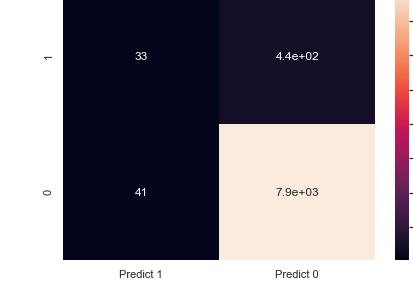

In [466]:
PrintLogisticRegressionPerformance(bank_df_with_dummies_no_outliers_prepared, 'Target')

### Decision Tree Model

training dtree score:  1.0
test dtree score:  0.9255143059825017
0.9255143059825017
Accuracy: 0.9255143059825017
Precision: 0.3952991452991453
Recall: 0.34774436090225563
F1 Score:  0.185


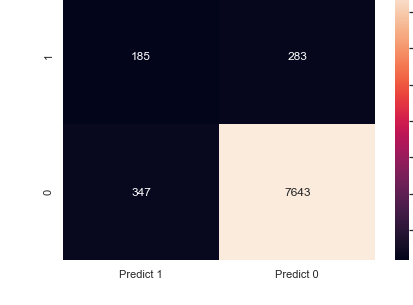

In [467]:
PrintDecisionTreePerformance(bank_df_with_dummies_no_outliers_prepared, 'Target')

bagging score: 0.9483329392291322
Accuracy: 0.9483329392291322
Precision: 0.2841880341880342
Recall: 0.5659574468085107
F1 Score:  0.18918918918918917


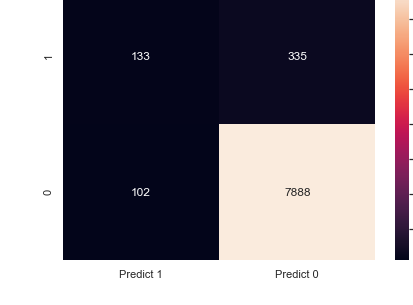

In [468]:
PrintBaggingPerformance(bank_df_with_dummies_no_outliers_prepared, 'Target')

score: 0.9424213762118704
Accuracy: 0.9424213762118704
Precision: 0.10042735042735043
Recall: 0.415929203539823
F1 Score:  0.08089500860585198


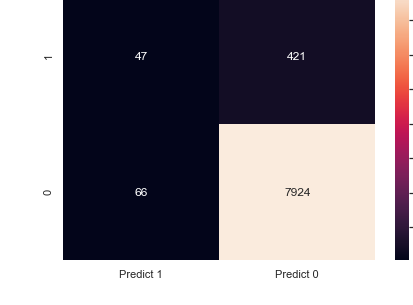

In [469]:
PrintBoostingPerformance(bank_df_with_dummies_no_outliers_prepared, 'Target')

score:  0.9473870891463703
Accuracy: 0.9473870891463703
Precision: 0.09615384615384616
Recall: 0.6716417910447762
F1 Score:  0.08411214953271029


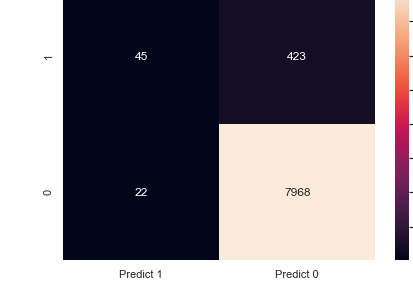

In [470]:
PrintGradientBoosting(bank_df_with_dummies_no_outliers_prepared, 'Target')

In [480]:
GetMetricDataframe(bank_df_with_dummies_no_outliers_prepared, 'Target')

,accuracy,recall,precision,score,f1
gradient,0.947387,0.096154,0.671642,0.947387,0.084112
boosting,0.942421,0.100427,0.415929,0.942421,0.080895
bagging,0.948333,0.284188,0.565957,0.948333,0.189189
dtree,0.925514,0.395299,0.347744,0.925514,0.185000
logistic,0.943722,0.070513,0.445946,0.943722,0.060886
